# <center>PRÁCTICA 2: APRENDIZAJE SUPERVISADO (DengAI)<center>

**Nombre y apellidos:** Jonnathan Campoberde

**Usuario VIU:** jcampoberdea

---
# Resumen
---

La fiebre del dengue es una enfermedad transmitida por mosquitos que ocurre en las partes tropicales y subtropicales del mundo. En casos graves, la fiebre del dengue puede causar hemorragias graves, presión arterial baja e incluso la muerte.En esta practica se va a usar los datos de la competición DengAI para predecir el número de casos de dengue en una semana particular basado en datos climáticos y ubicación.

El análisis del dataset DengAI se realizó tareas de preprocesamiento para eliminar datos duplicados, imputar valores faltantes, conversiones de temperaturas de grados Kelvin a Celsius para el dataset de entrenamiento como de prueba para facilitar la interpretación de los resultados, ademas en el procesamiento se  eliminaron los outliers en lugar de imputarlos, ya que se consideró que esto evitaría sobreajustes y existia una pequeña cantidad de registros atípicos en el dataset de entrenamiento para posteriormente realizar un analisi univariante, bivariante y multivariante con el proposito de entender como estan los datos.

En la selección de caracteristicas relevantes y que aporten información para los modelos de predicción se tomo en cuenta los resultados obtenidos en la practica 1, adicionalmente se uso la matriz de correlación para determinar las variables que ademas de ser relevantes en el dataset aportan mayor información para la predicción de la variable objetivo de la practica `total_cases`.

En la selección de modelos se tomo en cuenta aquellos modelos que mayor compatibilidad tienen con los datos que se estan analizando, tomado los modelos Random forest, Máquinas de Soporte Vectorial para regresión, Gradient Boosting para Regresión, XGBRegressor y Deep Neural Network, los mismos que son evaluando en la metrica MAE (Error Absoluto Medio).

El modelo final seleccionado fue Random Forest, por su balance entre evitar overfitting y underfitting, logrando el mejor puntaje en la competición de DrivenData dando un buen resultado en las predicciones realizadas.










---
# Inicialización
---

In [ ]:
# Imports generales
import pandas as pd
import io
from google.colab import files
import numpy as np
import time
from sklearn.preprocessing import LabelEncoder, RobustScaler
import missingno as msno
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from scipy.stats import uniform
from sklearn.ensemble import GradientBoostingRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.base import BaseEstimator, RegressorMixin
from tpot import TPOTRegressor
from xgboost import XGBRegressor

seed = 42  # Semilla aleatoria arbitraria

pd.set_option('display.max_columns', None)

def upload_files (index_fields=None):
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')), index_col = index_fields)

    return df

def download_predictions(test,y_test_pred,name_file):
    if (name_file==""):
      name_file = "practica2_pred_" + time.strftime("%Y") + time.strftime("%m") + time.strftime("%d") + time.strftime("%H") + time.strftime("%M") + time.strftime("%S") + ".csv"
    else:
      name_file+=".csv"

    y = np.rint(y_test_pred).astype(int)
    res = np.hstack(y)
    # EJEMPLO: Cambiar valores negativos a cero
    res[y_test_pred < 0] = 0

    predictions = pd.DataFrame({ 'city': test['city'], 'year': test['year'], 'weekofyear': test['weekofyear'], 'total_cases': res})
    predictions['year'] = predictions['year'].astype(int)
    predictions['weekofyear'] = predictions['weekofyear'].astype(int)
    with open(name_file, 'w') as f:
      predictions.to_csv(f, index = False)
    files.download(name_file)
    print("Downloaded " + name_file)

In [ ]:
#Dependencias
#!pip install tensorflow
#!pip install keras
#!pip install tpot

In [ ]:
# Subir el conjunto de entrenamiento sin variable objetivo (dengue_features_train.csv)
train_feat = upload_files()
print(train_feat.shape)
train_feat.head()

Saving dengue_features_train.csv to dengue_features_train.csv
User uploaded file "dengue_features_train.csv" with length 288596 bytes
(1456, 24)


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [ ]:
# Subir la variable objetivo total_cases del conjunto de entrenamiento (dengue_labels_train.csv)
train_labels = upload_files()
train = pd.merge(train_feat,train_labels,on=['city', 'year', 'weekofyear'])
train.head()

Saving dengue_labels_train.csv to dengue_labels_train.csv
User uploaded file "dengue_labels_train.csv" with length 19582 bytes


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


In [ ]:
# Subir el conjunto de test sin variable objetivo (dengue_features_test.csv)
test = upload_files()
test.head()

Saving dengue_features_test.csv to dengue_features_test.csv
User uploaded file "dengue_features_test.csv" with length 82465 bytes


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,2008,18,2008-04-29,-0.0189,-0.018900,0.102729,0.091200,78.60,298.492857,298.550000,294.527143,301.1,296.4,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2
1,sj,2008,19,2008-05-06,-0.0180,-0.012400,0.082043,0.072314,12.56,298.475714,298.557143,294.395714,300.8,296.7,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3
2,sj,2008,20,2008-05-13,-0.0015,NaN,0.151083,0.091529,3.66,299.455714,299.357143,295.308571,302.2,296.4,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0
3,sj,2008,21,2008-05-20,NaN,-0.019867,0.124329,0.125686,0.00,299.690000,299.728571,294.402857,303.0,296.9,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3
4,sj,2008,22,2008-05-27,0.0568,0.039833,0.062267,0.075914,0.76,299.780000,299.671429,294.760000,302.3,297.3,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1


---
# Reexploración
---

## Recopilación de Datos
Los datos a ser usados a lo largo del analisis fueron proporcionados por driven data, los cuales contienen multiples caracteristicas de la ciudad, datos meteorologicos relacionadas a la problematica de los mosquitos del dengue, los mismos que se pueden encontrar en la siguiente enlace https://erdem.pl/2020/07/deng-ai-how-to-approach-data-science-competitions-eda

### Descripción de los datos

| Columna                           | Descripción                                                        |
|-----------------------------------|--------------------------------------------------------------------|
| city                              | Abreviaturas de ciudades: sj para San Juan e iq para Iquitos       |
| week_start_date                   | Fecha dada en formato yyyy-mm-dd                                   |
| station_max_temp_c                | Temperatura máxima                                                 |
| station_min_temp_c                | Temperatura mínima                                                 |
| station_avg_temp_c                | Temperatura promedio                                               |
| station_precip_mm                 | Precipitación total                                                |
| station_diur_temp_rng_c           | Rango de temperatura diurna                                        |
| precipitation_amt_mm              | Precipitación total                                                |
| reanalysis_sat_precip_amt_mm      | Precipitación total                                                |
| reanalysis_dew_point_temp_k       | Temperatura media del punto de rocío                               |
| reanalysis_air_temp_k             | Temperatura media del aire                                         |
| reanalysis_relative_humidity_percent | Humedad relativa media                                             |
| reanalysis_specific_humidity_g_per_kg | Humedad específica media                                           |
| reanalysis_precip_amt_kg_per_m2   | Precipitación total                                                |
| reanalysis_max_air_temp_k         | Temperatura máxima del aire                                        |
| reanalysis_min_air_temp_k         | Temperatura mínima del aire                                        |
| reanalysis_avg_temp_k             | Temperatura promedio del aire                                      |
| reanalysis_tdtr_k                 | Rango de temperatura diurna                                        |
| ndvi_se                           | Píxel al sureste del centroide de la ciudad                        |
| ndvi_sw                           | Píxel al suroeste del centroide de la ciudad                       |
| ndvi_ne                           | Píxel al noreste del centroide de la ciudad                        |
| ndvi_nw                           | Píxel al noroeste del centroide de la ciudad                       |
| total_cases                           | El total de casos de dengue reportados                       |


#### Datos de entrenamiento

In [ ]:
# Verificar si los índices son únicos
print("Verificar si los índices son únicos: ",train.index.is_unique)
# Verificar si las columnas son únicas
print("Verificar si las columnas son únicas:",train.columns.is_unique)

Verificar si los índices son únicos:  True
Verificar si las columnas son únicas: True


In [ ]:
registros, columnas = (train.shape)
print("El dataset contiene {registros} registros y {columnas} columnas.".format(registros=registros,columnas=columnas))

El dataset contiene 1456 registros y 25 columnas.


In [ ]:
#Se imprime todas las columnas del dataset
print('Las columnas del dataset: {columnas}'.format(columnas=','.join(train.columns.to_list())))

Las columnas del dataset: city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases


#### Datos de prueba

In [ ]:
# Verificar si los índices son únicos
print("Verificar si los índices son únicos: ",test.index.is_unique)
# Verificar si las columnas son únicas
print("Verificar si las columnas son únicas:",test.columns.is_unique)

Verificar si los índices son únicos:  True
Verificar si las columnas son únicas: True


In [ ]:
registros, columnas = (test.shape)
print("El dataset contiene {registros} registros y {columnas} columnas.".format(registros=registros,columnas=columnas))

El dataset contiene 416 registros y 24 columnas.


In [ ]:
#Se imprime todas las columnas del dataset
print('Las columnas del dataset: {columnas}'.format(columnas=','.join(test.columns.to_list())))

Las columnas del dataset: city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm


### Descripción de manera general de los tipos de variable para las columnas del dataframe de entrenamiento

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

In [ ]:
#Se muestra la cantidad de registros por columa que tienen valores nulos
pd.DataFrame(train.isna().sum()).T.style.background_gradient()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,0,0,0,0,194,52,22,22,13,10,10,10,10,10,10,10,13,10,10,43,43,20,14,22,0


### Descripción de manera general de los tipos de variable para las columnas del dataframe de prueba

Se observa que el dataset tiene registros nulos en diversas columnas que se debe de analizar en las etapas posteriores

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   416 non-null    object 
 1   year                                   416 non-null    int64  
 2   weekofyear                             416 non-null    int64  
 3   week_start_date                        416 non-null    object 
 4   ndvi_ne                                373 non-null    float64
 5   ndvi_nw                                405 non-null    float64
 6   ndvi_se                                415 non-null    float64
 7   ndvi_sw                                415 non-null    float64
 8   precipitation_amt_mm                   414 non-null    float64
 9   reanalysis_air_temp_k                  414 non-null    float64
 10  reanalysis_avg_temp_k                  414 non-null    float64
 11  reanal

In [ ]:
#Se muestra la cantidad de registros por columa que tienen valores nulos
pd.DataFrame(test.isna().sum()).T.style.background_gradient()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,0,0,0,0,43,11,1,1,2,2,2,2,2,2,2,2,2,2,2,12,12,3,9,5


Se observa que existen datos nulos en los datos de entrenamiento

### Verificar la cantidad de registros duplicados en los datos de entrenamiento

In [ ]:
dengue_duplicated = train[train.duplicated()]
dengue_duplicated

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases


No existen registros con datos duplicados que deban ser eliminados del dataframe

### Verificar la cantidad de registros duplicados en los datos de prueba

In [ ]:
dengue_duplicated = test[test.duplicated()]
dengue_duplicated

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm


No existen registros con datos duplicados que deban ser eliminados del dataframe de prueba

### Descripción de los datos de entrenemiento manera general usando medidas estadisticas
Se muestra los datos como si fueran un mapa da calor para poder identificar de mejor manera los datos extremos para una variable

In [ ]:
train.describe(percentiles=[.25, .50, .75, 1]).T.style.background_gradient()

,count,mean,std,min,25%,50%,75%,100%,max
year,1456.000000,2001.031593,5.408314,1990.000000,1997.000000,2002.000000,2005.000000,2010.000000,2010.000000
weekofyear,1456.000000,26.503434,15.019437,1.000000,13.750000,26.500000,39.250000,53.000000,53.000000
ndvi_ne,1262.000000,0.142294,0.140531,-0.406250,0.044950,0.128817,0.248483,0.508357,0.508357
ndvi_nw,1404.000000,0.130553,0.119999,-0.456100,0.049217,0.121429,0.216600,0.454429,0.454429
ndvi_se,1434.000000,0.203783,0.073860,-0.015533,0.155087,0.196050,0.248846,0.538314,0.538314
ndvi_sw,1434.000000,0.202305,0.083903,-0.063457,0.144209,0.189450,0.246982,0.546017,0.546017
precipitation_amt_mm,1443.000000,45.760388,43.715537,0.000000,9.800000,38.340000,70.235000,390.600000,390.600000
reanalysis_air_temp_k,1446.000000,298.701852,1.362420,294.635714,297.658929,298.646429,299.833571,302.200000,302.200000
reanalysis_avg_temp_k,1446.000000,299.225578,1.261715,294.892857,298.257143,299.289286,300.207143,302.928571,302.928571
reanalysis_dew_point_temp_k,1446.000000,295.246356,1.527810,289.642857,294.118929,295.640714,296.460000,298.450000,298.450000


### Eliminar y crear columnas en el dataframe sin procesar
Se elimina algunas las columnas del dataframe al considerar que no aportan información relevante en el modelo

+ Se crea la columna `month` al considerar que el mes es información importante pues el dengue es una enfermedad cuyo brote está relacionado con factores climáticos, como la precipitación, las temperaturas altas y la humedad relativa, que favorecen la proliferación de los mosquitos vectores que comunmente aumenta en ciertas epocas del año.

+ Se elimina la columna `week_start_date` al considerar que no aportan información relevante en el modelo pues se ha obtenido el mes y la semana donde se recopilo los datos.

In [ ]:
if ("week_start_date" in train.columns):
    #entrenamiento
    train['week_start_date'] = pd.to_datetime(train['week_start_date'])
    train['month'] = train['week_start_date'].dt.month
    train.drop("week_start_date", axis = 1, inplace = True)

if ("week_start_date" in test.columns):
    #test
    test['week_start_date'] = pd.to_datetime(test['week_start_date'])
    test['month'] = test['week_start_date'].dt.month
    test.drop("week_start_date", axis = 1, inplace = True)

#### Códificación de variables categoricas
En este caso la variable categorica city se codifica a una variable numerica antes de aplicar algoritmos debido a que facilita el analisis de los datos al ser numericos

In [ ]:
#Datos de entrenamiento
#Se codifica los datos de las varaible de la ciuddad para poder aplicar la imputación MICE
le = LabelEncoder()
df_imputar = train.copy()
df_imputar['city'] = le.fit_transform(df_imputar['city'])
# Ver las clases mapeadas por LabelEncoder
print('Las clases fueron mapeadas en este orden: ',le.classes_)
df_imputar

Las clases fueron mapeadas en este orden:  ['iq' 'sj']


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month
0,1,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4,4
1,1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5,5
2,1,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4,5
3,1,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3,5
4,1,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,296.825714,309.7,294.5,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5,5
1452,0,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,296.452857,308.5,291.9,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8,6
1453,0,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,295.501429,305.5,292.4,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,1,6
1454,0,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,295.324286,306.1,291.9,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,1,6


In [ ]:
#Datos de prueba
#Se codifica los datos de las varaible de la ciuddad para poder aplicar la imputación MICE
test['city'] = le.transform(test['city'])
test

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1,2008,18,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,298.550000,294.527143,301.1,296.4,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2,4
1,1,2008,19,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,298.557143,294.395714,300.8,296.7,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3,5
2,1,2008,20,-0.001500,NaN,0.151083,0.091529,3.66,299.455714,299.357143,295.308571,302.2,296.4,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0,5
3,1,2008,21,NaN,-0.019867,0.124329,0.125686,0.00,299.690000,299.728571,294.402857,303.0,296.9,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3,5
4,1,2008,22,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,299.671429,294.760000,302.3,297.3,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,0,2013,22,0.301471,0.380029,0.280629,0.383186,41.12,297.774286,298.964286,295.638571,305.5,292.7,67.60,89.990000,41.12,17.185714,10.100000,27.400000,9.050000,32.6,21.8,33.0,5
412,0,2013,23,0.247600,0.296343,0.285371,0.350357,71.52,297.167143,298.328571,295.845714,306.3,291.6,45.70,93.891429,71.52,17.448571,9.657143,27.520000,10.720000,33.8,21.4,68.0,6
413,0,2013,24,0.238729,0.251029,0.252586,0.249771,78.96,295.831429,296.607143,294.894286,304.6,290.7,45.22,94.967143,78.96,16.410000,7.385714,27.200000,10.075000,32.6,21.6,93.2,6
414,0,2013,25,0.310429,0.302700,0.406614,0.403943,39.54,295.778571,297.400000,293.648571,305.9,292.5,4.70,89.057143,39.54,15.137143,8.228571,26.700000,8.480000,32.2,21.8,34.1,6


### Eliminar los datos duplicados del dataframe
En este caso el dataframe de entrenamiento y de prueba no contiene datos duplicados por lo que no es necesario realizar este paso en nuestro dataframe


#### Analisis de los datos que tienen valores nulos
En el analisis anterior se verifico que el campo `ndvi_ne` es el que más tiene datos faltantes y al tener 257 datos de un total de 1456 lo cual es una cantidad considerable por lo que se va a completar estos valores usando la interpolación basándose en los valores adyacentes.

#### Visualización de Patrones de Nulos en los datos de entrenamiento

<Axes: >

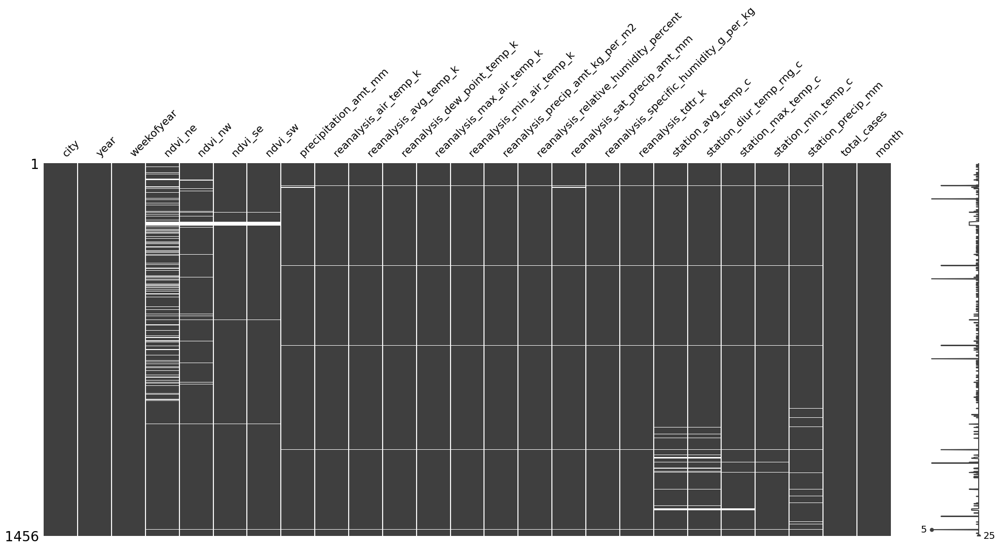

In [ ]:
# Visualizar los valores nulos de entrenamientod
msno.matrix(df_imputar)

#### Visualización de Patrones de Nulos en los datos de prueba

<Axes: >

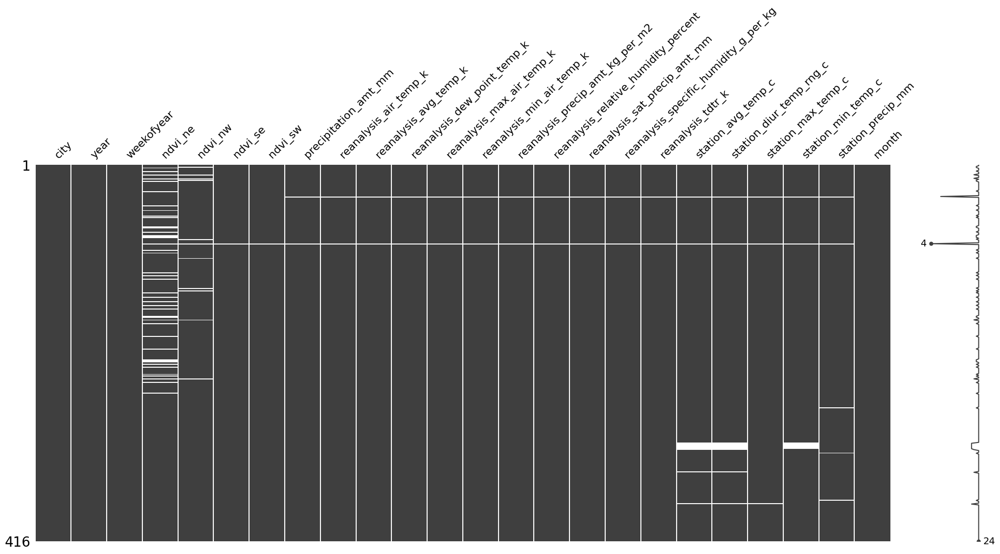

In [ ]:
# Visualizar los valores nulos de entrenamientod
msno.matrix(test)

#### Imputar los valores nulos en el dataframe de entrenamiento y de prueba
Se divide los datos por las ciudades para aprovechar los datos historicos por ciudad con el objetivo de tener los datos a imputar con mejor calidad, adicional a ello se usa `Multiple Imputation by Chained Equations (MICE)` es un método estadístico de imputación múltiple que permite llenar valores faltantes en un conjunto de datos de manera iterativa y utilizando modelos específicos para cada variable incompleta.

In [ ]:
dengue_df_sj = df_imputar[df_imputar['city']==1]
dengue_df_sj_aux = dengue_df_sj.drop(columns=['total_cases'], inplace=False)
test_sj = test[test['city']==1]

# imputador iterativo (MICE)
mice_imputer_sj = IterativeImputer(random_state=seed)
# aplicar el imputador al DataFrame de entrenemiento
dengue_df_sj_imputed = pd.DataFrame(mice_imputer_sj.fit_transform(dengue_df_sj_aux), columns=dengue_df_sj_aux.columns)
dengue_df_sj_imputed['total_cases']=dengue_df_sj['total_cases'].values
dengue_df_sj_imputed.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0,4
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0,5
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0,4
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0,3
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0,6


In [ ]:
# aplicar el imputador al DataFrame de prueba
test_sj = pd.DataFrame(mice_imputer_sj.transform(test_sj), columns=test_sj.columns)
test_sj.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,2008.0,18.0,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,298.550000,294.527143,301.1,296.4,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2,4.0
1,1.0,2008.0,19.0,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,298.557143,294.395714,300.8,296.7,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3,5.0
2,1.0,2008.0,20.0,-0.001500,-0.013019,0.151083,0.091529,3.66,299.455714,299.357143,295.308571,302.2,296.4,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0,5.0
3,1.0,2008.0,21.0,-0.011881,-0.019867,0.124329,0.125686,0.00,299.690000,299.728571,294.402857,303.0,296.9,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3,5.0
4,1.0,2008.0,22.0,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,299.671429,294.760000,302.3,297.3,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1,5.0


In [ ]:
dengue_df_iq = df_imputar[df_imputar['city']==0]
dengue_df_iq_aux = dengue_df_iq.drop(columns=['total_cases'], inplace=False)
mice_imputer_iq = IterativeImputer(random_state=seed)

dengue_df_iq_imputed = pd.DataFrame(mice_imputer_iq.fit_transform(dengue_df_iq_aux), columns=dengue_df_iq_aux.columns)
dengue_df_iq_imputed['total_cases']=dengue_df_iq['total_cases'].values
dengue_df_iq_imputed.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
0,0.0,2000.0,26.0,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,295.184286,307.3,293.1,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,7.0,0
1,0.0,2000.0,27.0,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,295.358571,306.6,291.1,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,7.0,0
2,0.0,2000.0,28.0,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,295.622857,304.5,292.6,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,7.0,0
3,0.0,2000.0,29.0,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,292.797143,303.6,288.6,23.96,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,7.0,0
4,0.0,2000.0,30.0,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,293.957143,307.0,291.5,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,7.0,0


In [ ]:
#Datos de test
test_iq = test[test['city']==0]
test_iq = pd.DataFrame(mice_imputer_iq.transform(test_iq), columns=test_iq.columns)
test_iq.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,0.0,2010.0,26.0,0.183783,0.142500,0.225129,0.150214,82.29,297.648571,299.214286,296.118571,307.9,293.7,34.11,92.581429,82.29,17.654286,9.428571,27.440,10.760,33.8,21.5,11.2,7.0
1,0.0,2010.0,27.0,0.291657,0.272267,0.330700,0.320914,25.30,298.224286,299.464286,294.831429,307.7,292.2,9.10,83.885714,25.30,16.320000,10.157143,27.025,9.625,33.0,21.2,8.9,7.0
2,0.0,2010.0,28.0,0.208543,0.366457,0.212629,0.255514,62.14,297.955714,298.964286,296.417143,306.4,292.5,61.09,92.057143,62.14,18.030000,9.557143,26.950,10.350,33.4,21.6,22.6,7.0
3,0.0,2010.0,29.0,0.089286,0.063214,0.122057,0.081957,47.80,295.715714,296.642857,293.638571,306.4,289.3,19.60,88.970000,47.80,15.394286,7.828571,26.900,9.700,33.3,14.2,4.8,7.0
4,0.0,2010.0,30.0,0.306100,0.327683,0.250086,0.267914,56.30,298.502857,300.000000,293.892857,308.1,290.5,18.93,78.610000,56.30,15.468571,11.771429,27.050,11.850,33.5,16.9,3.0,7.0


In [ ]:
#Unimos todos los dos dataframes para reunir la data
df_interpolated = pd.concat([dengue_df_sj_imputed, dengue_df_iq_imputed], ignore_index=True, sort=False)
df_interpolated.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0,4
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0,5
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0,4
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0,3
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0,6


In [ ]:
test = pd.concat([test_sj, test_iq], ignore_index=True, sort=False)
test.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,2008.0,18.0,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,298.550000,294.527143,301.1,296.4,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2,4.0
1,1.0,2008.0,19.0,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,298.557143,294.395714,300.8,296.7,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3,5.0
2,1.0,2008.0,20.0,-0.001500,-0.013019,0.151083,0.091529,3.66,299.455714,299.357143,295.308571,302.2,296.4,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0,5.0
3,1.0,2008.0,21.0,-0.011881,-0.019867,0.124329,0.125686,0.00,299.690000,299.728571,294.402857,303.0,296.9,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3,5.0
4,1.0,2008.0,22.0,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,299.671429,294.760000,302.3,297.3,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1,5.0


In [ ]:
registros_con_nulos = df_interpolated[df_interpolated.isnull().any(axis=1)]
print('Existen {num_nulos} registros con algun valor nulo en el dataframe de entrenamiento'.format(num_nulos=len(registros_con_nulos)))

Existen 0 registros con algun valor nulo en el dataframe de entrenamiento


In [ ]:
registros_con_nulos_test = test[test.isnull().any(axis=1)]
print('Existen {num_nulos} registros con algun valor nulo en el dataframe de prueba'.format(num_nulos=len(registros_con_nulos_test)))

Existen 0 registros con algun valor nulo en el dataframe de prueba


### Estandarizar la escala de los datos
La escala que se ocupa para medir la temperatura en el dataset en ciertas columas esta en kelvin y en otras esta en grados Celsius, por lo que se va a estandarizar todo para que nuestra temperatura este en grados Celsius.

#### Conversión de Kelvin a Celsius:

$$
\text{Celsius} = \text{Kelvin} - 273.15
$$

In [ ]:
#Datos de entrenamiento
filtered_columns = ["reanalysis_air_temp_k", "reanalysis_avg_temp_k","reanalysis_dew_point_temp_k","reanalysis_max_air_temp_k","reanalysis_min_air_temp_k"]
df_temp_cleaned = df_interpolated.copy()
for column in filtered_columns:
    df_temp_cleaned[column] = df_temp_cleaned[column] - 273.15
df_temp_cleaned.head(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,24.422857,24.592857,19.264286,26.65,22.75,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0,4
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,25.061429,25.292857,20.801429,27.75,23.25,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0,5
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,25.631429,25.728571,22.284286,27.35,24.15,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0,4
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,25.837143,26.078571,22.160000,28.25,23.85,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0,3
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,26.368571,26.514286,22.671429,28.75,24.35,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0,6
5,1.0,1990.0,23.0,0.170664,0.174850,0.254314,0.181743,9.58,26.480000,26.614286,22.701429,29.25,24.95,26.49,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,6.0,2
6,1.0,1990.0,24.0,0.112900,0.092800,0.205071,0.210271,3.48,26.057143,26.071429,22.715714,28.15,24.55,38.60,82.000000,3.48,17.234286,2.042857,27.414286,6.771429,32.2,23.3,29.7,6.0,4
7,1.0,1990.0,25.0,0.072500,0.072500,0.151471,0.133029,151.12,26.441429,26.378571,23.381429,27.45,25.25,30.00,83.375714,151.12,17.977143,1.571429,28.371429,7.685714,33.9,22.8,21.1,6.0,5
8,1.0,1990.0,26.0,0.102450,0.146175,0.125571,0.123600,19.32,26.428571,26.407143,23.228571,28.95,24.55,37.51,82.768571,19.32,17.790000,1.885714,28.328571,7.385714,33.9,22.8,21.1,6.0,10
9,1.0,1990.0,27.0,0.086577,0.121550,0.160683,0.202567,14.41,27.004286,27.128571,23.501429,29.15,25.55,28.40,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,7.0,6


In [ ]:
#Datos de prueba
test_aux = test.copy()
for column in filtered_columns:
    test[column] = test_aux[column] - 273.15
test_aux.head(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,2008.0,18.0,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,298.550000,294.527143,301.1,296.4,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2,4.0
1,1.0,2008.0,19.0,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,298.557143,294.395714,300.8,296.7,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3,5.0
2,1.0,2008.0,20.0,-0.001500,-0.013019,0.151083,0.091529,3.66,299.455714,299.357143,295.308571,302.2,296.4,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0,5.0
3,1.0,2008.0,21.0,-0.011881,-0.019867,0.124329,0.125686,0.00,299.690000,299.728571,294.402857,303.0,296.9,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3,5.0
4,1.0,2008.0,22.0,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,299.671429,294.760000,302.3,297.3,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1,5.0
5,1.0,2008.0,23.0,-0.044000,-0.030467,0.132000,0.083529,71.17,299.768571,299.728571,295.314286,301.9,297.6,22.55,76.557143,71.17,16.667143,2.857143,28.000000,5.171429,32.8,25.0,27.7,6.0
6,1.0,2008.0,24.0,-0.044300,-0.024925,0.132271,0.159157,48.99,300.062857,300.007143,295.650000,302.4,297.5,13.10,76.844286,48.99,17.010000,3.157143,27.400000,6.042857,31.1,23.3,91.7,6.0
7,1.0,2008.0,25.0,0.068187,0.082150,0.144371,0.116729,30.81,300.484286,300.578571,295.997143,303.5,297.5,7.20,76.870000,30.81,17.420000,3.900000,28.757143,6.985714,34.4,24.4,0.3,6.0
8,1.0,2008.0,26.0,0.010800,0.049900,0.100571,0.117329,8.02,300.601429,300.621429,296.268571,302.5,298.5,17.10,77.395714,8.02,17.678571,2.785714,28.657143,6.242857,32.8,23.9,28.7,6.0
9,1.0,2008.0,27.0,0.072667,0.106660,0.155429,0.164900,17.52,300.497143,300.528571,296.411429,302.3,298.7,11.90,78.534286,17.52,17.808571,2.228571,28.457143,4.628571,31.1,25.0,2.9,7.0


Una vez finalizada la limpieza de los datos de entrenamiento y de prueba se realiza el analisis de cada variable que conforman los datos del dataframe

### Analisis univariante de los datos

#### Analisis de cada una de las variables que conforman el dataset
Este analisis se lo realiza para conocer como esta la distribución de los datos y conocer la calidad de los mismos

In [ ]:
outliers = df = pd.DataFrame(columns=['variable', 'num_outliers'])
def interpretar_skewness(df, column):
    """
    Esta función calcula e interpreta el skewness de una columna específica en un DataFrame.

    :param df: DataFrame que contiene los datos.
    :param columna: Nombre de la columna para la cual se desea calcular el skewness.
    :return: Una interpretación del skewness y recomendaciones.
    """
    # Calcular el skewness
    skewness = df[column].skew()
    resultado = f'2) Skewness: {skewness}\n *Interpretación: '

    # Interpretar el skewness
    if skewness == 0:
        resultado += "La distribución es simétrica.\n"
        recommendation = "Se puede usar técnicas estadísticas que asumen normalidad."
    elif skewness > 0:
        resultado += "La distribución tiene cola larga a la derecha (asimetría positiva).\n"
        recommendation = "Considerar usar la mediana en lugar de la media. " \
                        "Se debe de verifica si hay outliers en el lado derecho."
    else:
        resultado += "La distribución tiene cola larga a la izquierda (asimetría negativa).\n"
        recommendation = "Considerar  la mediana en lugar de la media. " \
                        "Se debe de verifica si hay outliers en el lado izquierdo."
    resultado +=" *Interpretación de la magnitud: "
    # Evaluar la magnitud del skewness
    if 0 < skewness < 0.5 or -0.5 < skewness < 0:
        resultado += "Asimetría baja. La distribución es casi simétrica.\n"
    elif 0.5 <= skewness < 1 or -1 < skewness <= -0.5:
        resultado += "Asimetría moderada. La distribución presenta cierta asimetría.\n"
    elif 1 <= skewness < 2 or -2 < skewness <= -1:
        resultado += "Asimetría alta. La distribución es significativamente sesgada.\n"
    else:
        resultado += "Asimetría muy alta. La distribución es extremadamente sesgada.\n"

    # Imprimir recomendaciones
    resultado += " *Recomendaciones: " + recommendation

    return resultado

def interpretar_kurtosis(df, column):
    """
    Esta función interpreta el skewness de una columna específica en un DataFrame.

    :param valor_kurtosis: valor de valor_kurtosis
    """
    valor_kurtosis =  df[column].kurtosis()
    resultado = f'3) Kurtosis: {valor_kurtosis}\n *Interpretación: '
    if 2.9 <= valor_kurtosis <= 3.1:
        resultado += "La distribución es mesocúrtica (similar a una normal)"
    elif valor_kurtosis > 3:
        if 3 < valor_kurtosis <= 4:
            resultado += "La distribución es leptocúrtica (colas más gruesas, algunos outliers)"
        else:
            resultado += "La distribución es leptocúrtica (colas muy gruesas, muchos outliers)"
    elif valor_kurtosis < 3:
        if 2 <= valor_kurtosis < 3:
            resultado += "La distribución es platicúrtica (colas más delgadas, pocos outliers)"
        else:
            resultado += "La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)"

    return resultado

def detectar_outliers_graphical(df, column,k=1.5):
    """
    Detecta outliers en un DataFrame utilizando dos métodos: IQR y Z-score.

    :param df: DataFrame de pandas
    :param columna: Nombre de la columna en la que se buscan outliers
    :return: DataFrame con outliers detectados por ambos métodos
    """

    # Método IQR
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - k*IQR
    limite_superior = Q3 + k*IQR

    # Identificar outliers usando IQR
    outliers_IQR =len(df[(df[column] < limite_inferior) | (df[column] > limite_superior)])
    outlier = {'variable':column,'num_outliers': outliers_IQR}
    return f"4) Se ha detectado {outliers_IQR} outliers en los datos", outlier

def analysis_numeric_colum(df,col,k=2,ylabel=None,xlabel=None,title_hist=None,title_bar=None):
    sns.set(font_scale=0.8)
    sns.set_style("white")
    #Crear un histograma para las variables numericas
    sns.histplot(df[col], bins=60)
    if (ylabel is not None):
        plt.ylabel(ylabel)
    if (xlabel is not None):
        plt.xlabel(xlabel)
    plt.title("Histograma de la variable {var}".format(var=col), fontsize=14)
    plt.tight_layout()
    plt.show()

    #Para graficar el box plot
    sns.set(style="whitegrid")
    sns.boxplot(x=df[col])
    plt.title('Diagrama de caja de la variable {var}'.format(var=col))


    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

    result = stats.anderson(df[col])
    message, outlier = detectar_outliers_graphical(df,col,k)

    print("***Resumen de la variable***")
    if result.statistic < result.critical_values[2]:
        print('1) Los datos provienen de una distribución normal al nivel de significancia del 5%.')
    else:
        print('1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.')

    print(interpretar_skewness(df=df,column=col))
    print(interpretar_kurtosis(df=df, column=col))
    print(message)
    print("5) Datos resumidos de la variable")
    print(df[col].describe())
    return outlier

def detectar_outliers_var(df,input_columns,k=1.5):
    outliers = pd.DataFrame(columns=df.columns)

    for col in input_columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1

            limite_inferior = Q1 - k * IQR
            limite_superior = Q3 + k * IQR

            outliers_col = df[(df[col] < limite_inferior) | (df[col] > limite_superior)]
            outliers = pd.concat([outliers, outliers_col], axis=0)

    return outliers.drop_duplicates()


def eliminar_outliers_iqr_multi(df, columns, k=1.5):
    df_filtrado = df.copy()
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - k * IQR
        upper_bound = Q3 + k * IQR

        # Filtrar filas que no son outliers en la columna actual
        df_filtrado = df_filtrado[(df_filtrado[column] >= lower_bound) & (df_filtrado[column] <= upper_bound)]

    return df_filtrado

def generate_boxplot(data, numerical_cols, title = 'Distribución de Variables Numéricas'):
    # Generar box plots para las variables numéricas
    # Estilo y tamaño del gráfico
    plt.figure(figsize=(8, 6))
    sns.set(style="whitegrid")  # Estilo de fondo del gráficogenerate_boxplot

    # Crear el box plot utilizando Seaborn para una apariencia más elegante
    sns.boxplot(data=data[numerical_cols])
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel('Variables', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

def make_histogram(df, variable, bins=10):
    # Crear el histograma y guardar las frecuencias y bordes de las barras
    plt.figure(figsize=(10, 6))
    counts, edges, patches = plt.hist(df[variable], color='steelblue', edgecolor='black')

    # Añadir valores encima de cada barra
    for count, edge, patch in zip(counts, edges[:-1], patches):
        plt.text(edge + (edges[1] - edges[0]) / 2, count, int(count),
                 ha='center', va='bottom', fontsize=10, color='black')

    # Añadir título y etiquetas
    plt.title(f"Frecuencia de observaciones por {variable}")
    plt.xlabel(variable)
    plt.ylabel("Frecuencia")
    plt.tight_layout()  # Ajusta el gráfico para evitar que se corten las etiquetas

    # Mostrar el gráfico
    plt.show()

#### Analizando la variable ndvi_ne

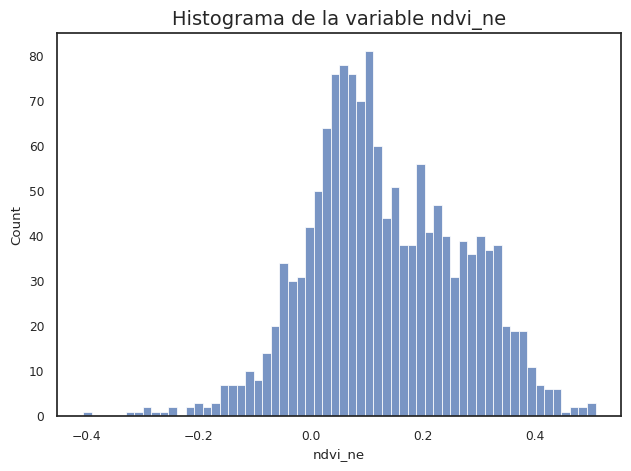

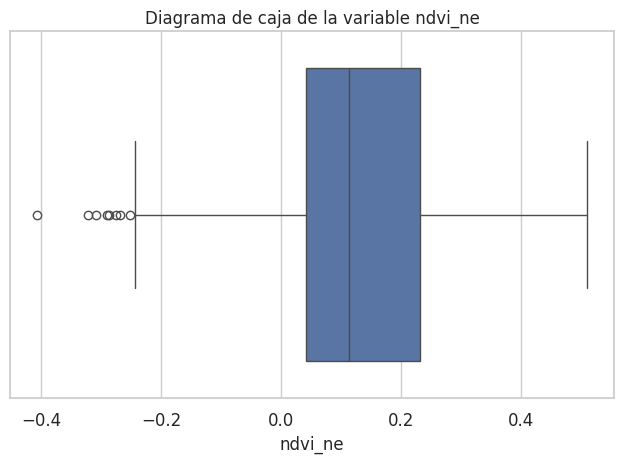

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.03893834134130159
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.0794175152919614
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.132189
std         0.135925
min        -0.406250
25%         0.041031
50%         0.112475
75%         0.231589
max         0.508357
Name: ndvi_ne, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_ne')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable ndvi_nw

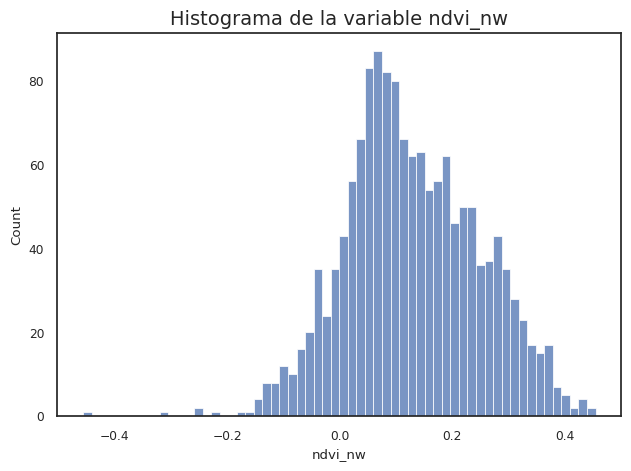

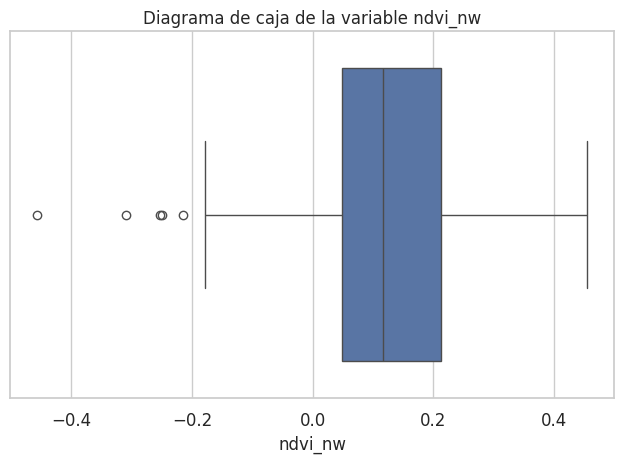

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.022593009786860643
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 0.08588498666352651
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 2 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.128691
std         0.118899
min        -0.456100
25%         0.048375
50%         0.117105
75%         0.213429
max         0.454429
Name: ndvi_nw, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_nw')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable ndvi_sw

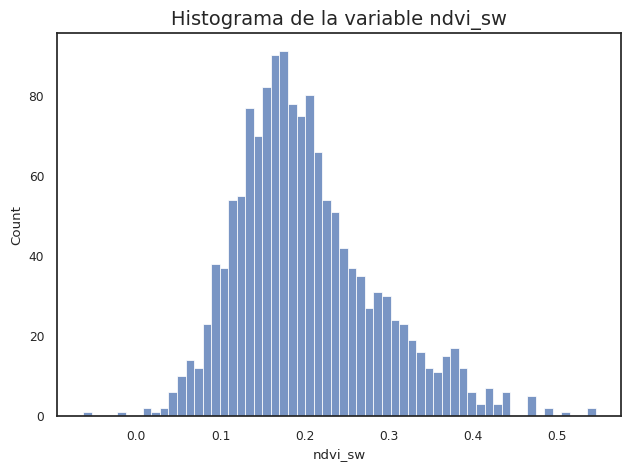

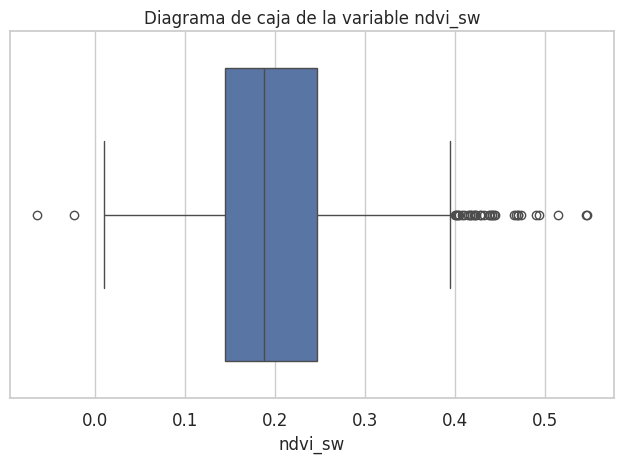

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.768624386070685
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 0.7514625387935987
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 11 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.201940
std         0.083438
min        -0.063457
25%         0.144718
50%         0.187957
75%         0.246775
max         0.546017
Name: ndvi_sw, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_sw')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable precipitation_amt_mm

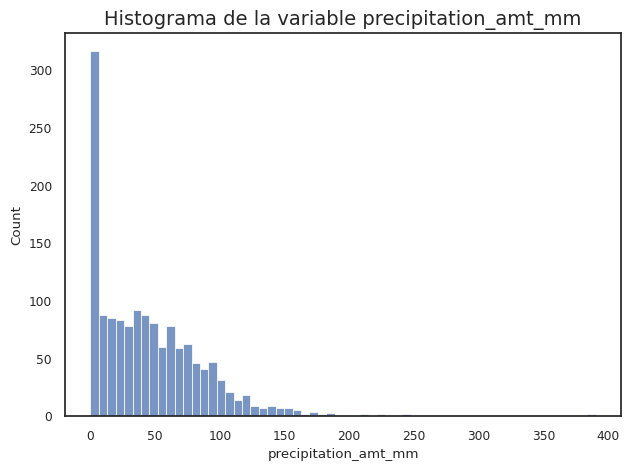

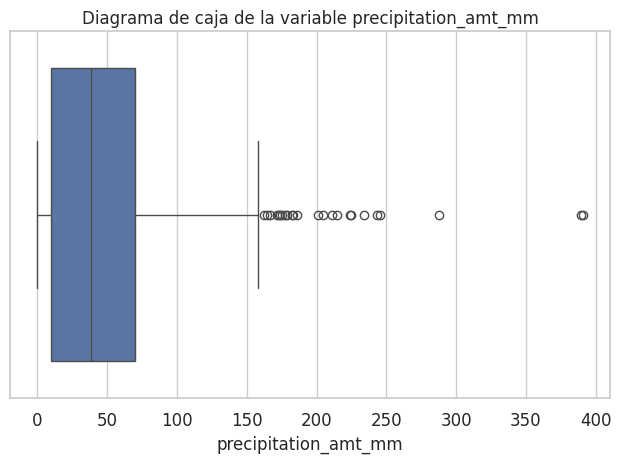

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.7440537903855187
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 6.8535103019580195
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 12 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       45.747569
std        43.538117
min         0.000000
25%         9.960000
50%        38.170000
75%        70.047500
max       390.600000
Name: precipitation_amt_mm, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='precipitation_amt_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_air_temp_k

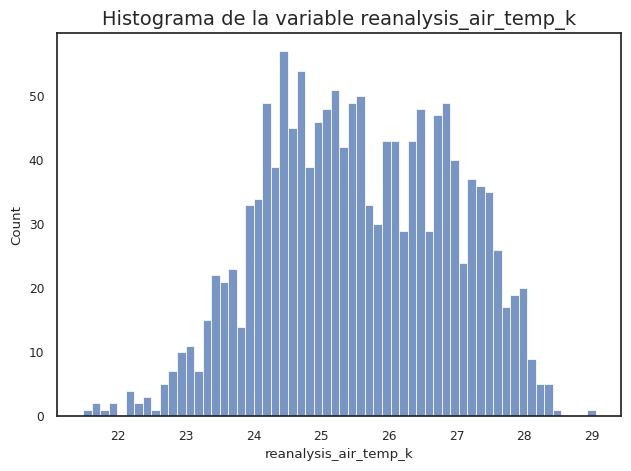

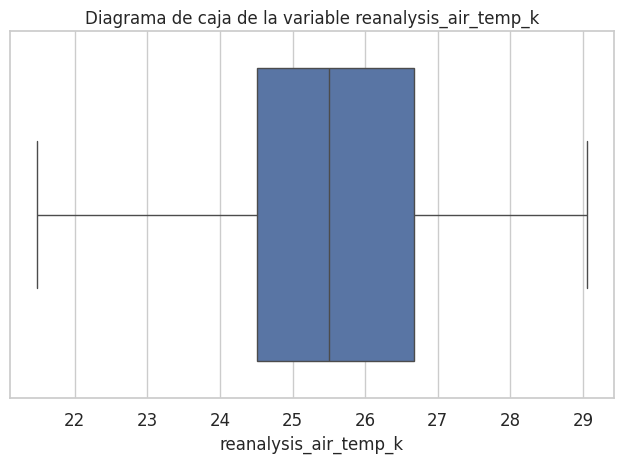

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.08075524585466495
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.6720832807768731
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       25.551467
std         1.358715
min        21.485714
25%        24.515000
50%        25.498571
75%        26.677500
max        29.050000
Name: reanalysis_air_temp_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_avg_temp_k

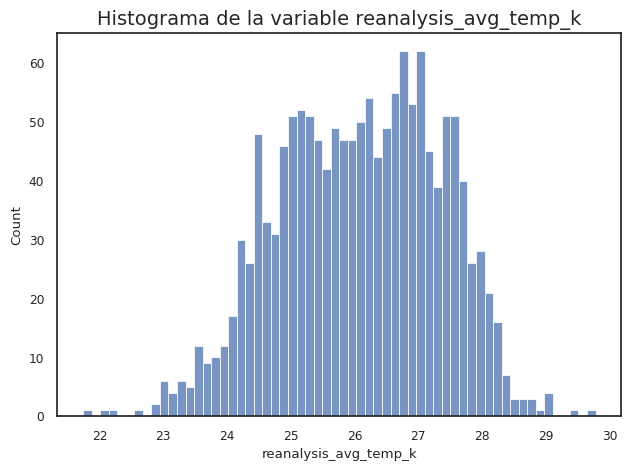

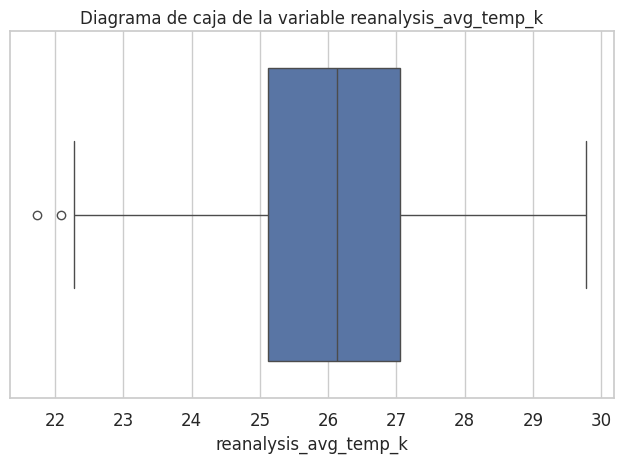

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.19051278211894251
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.5129288627220241
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       26.075714
std         1.257393
min        21.742857
25%        25.114286
50%        26.135714
75%        27.057143
max        29.778571
Name: reanalysis_avg_temp_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_avg_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_dew_point_temp_k

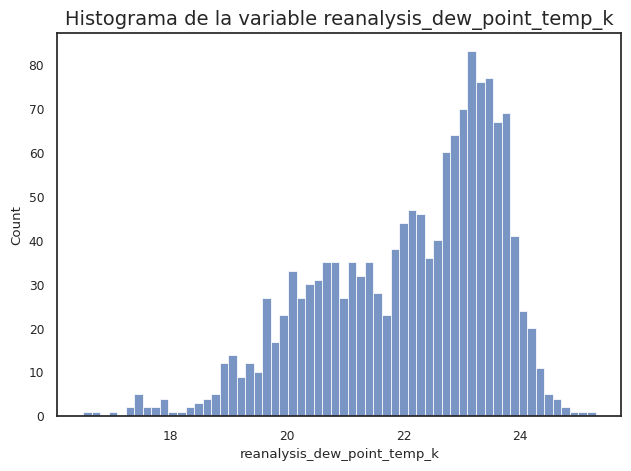

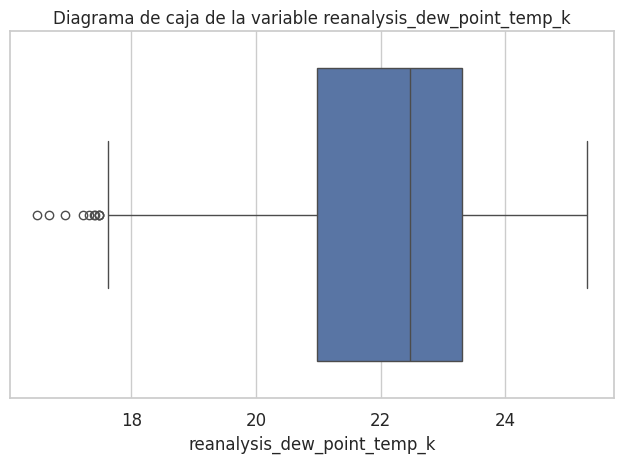

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.7240536370551722
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.0903645346690749
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.096491
std         1.522632
min        16.492857
25%        20.980357
50%        22.475714
75%        23.306071
max        25.300000
Name: reanalysis_dew_point_temp_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_dew_point_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_max_air_temp_k

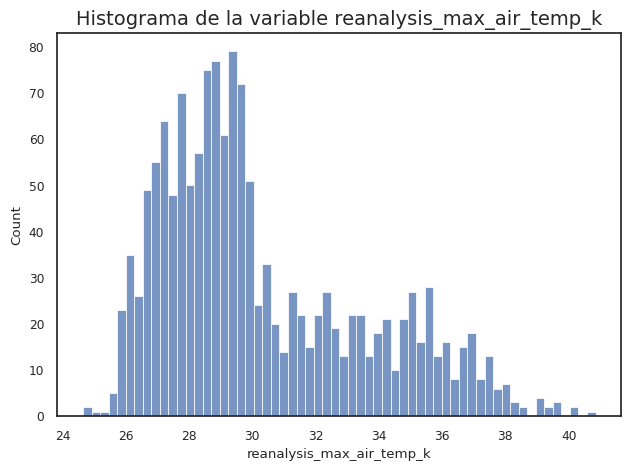

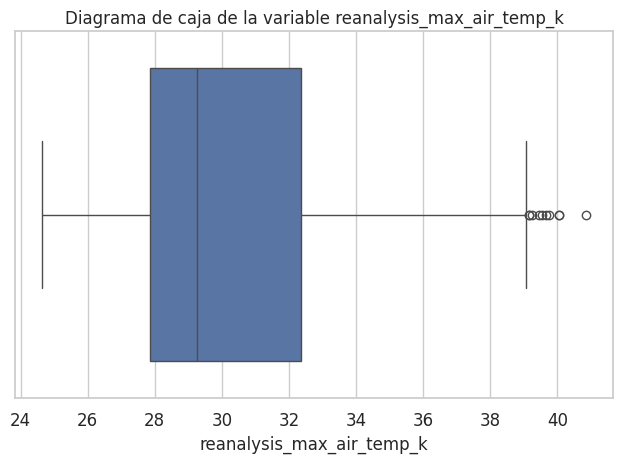

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.845896927136754
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.18863306864798624
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       30.277699
std         3.230577
min        24.650000
25%        27.850000
50%        29.250000
75%        32.350000
max        40.850000
Name: reanalysis_max_air_temp_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_max_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_min_air_temp_k

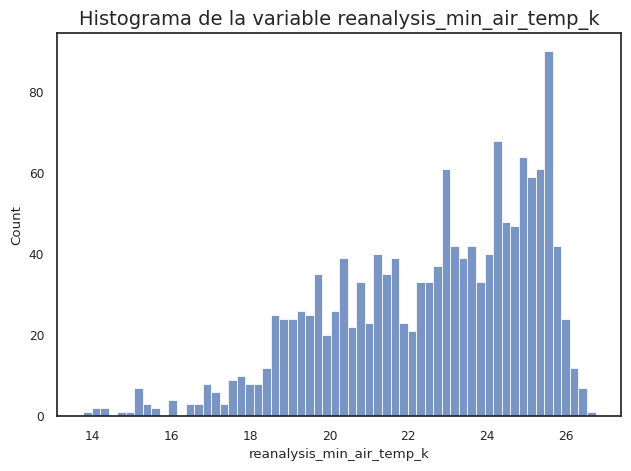

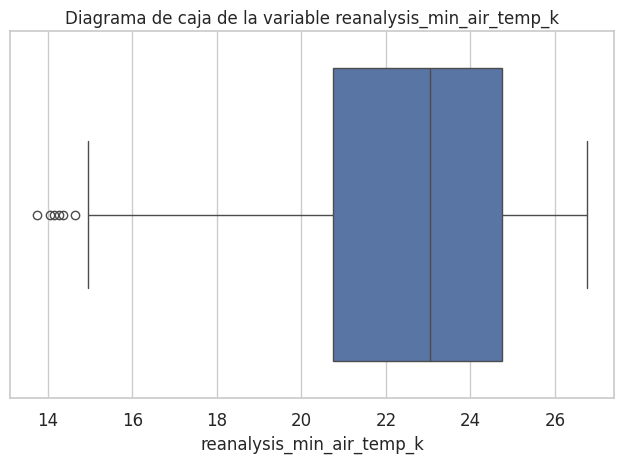

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.6721281931761129
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.21351018828225188
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.567808
std         2.562511
min        13.750000
25%        20.750000
50%        23.050000
75%        24.750000
max        26.750000
Name: reanalysis_min_air_temp_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_min_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_precip_amt_kg_per_m2

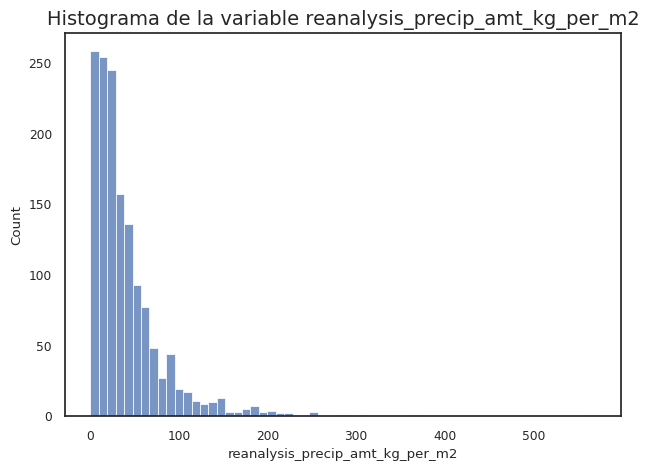

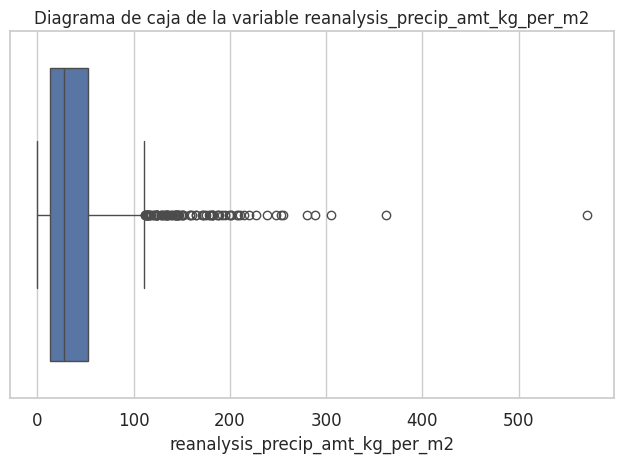

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 3.3742927976156833
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría muy alta. La distribución es extremadamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 22.162817631462364
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 62 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       40.196827
std        43.388348
min         0.000000
25%        13.200000
50%        27.200000
75%        52.525000
max       570.500000
Name: reanalysis_precip_amt_kg_per_m2, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_precip_amt_kg_per_m2')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_relative_humidity_percent

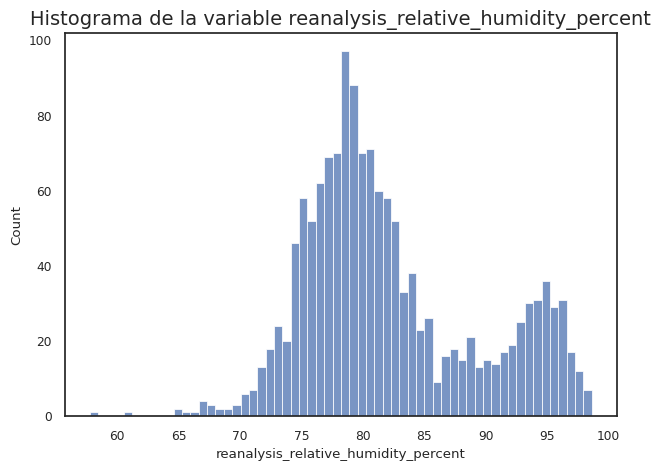

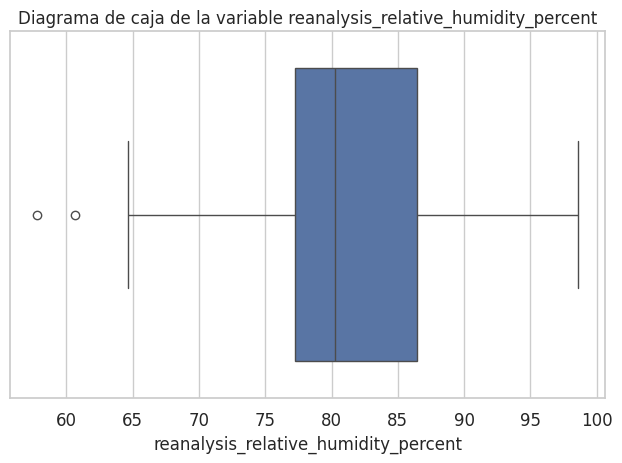

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.5732623383389475
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.3902312296370014
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       82.165152
std         7.141162
min        57.787143
25%        77.226429
50%        80.287857
75%        86.437500
max        98.610000
Name: reanalysis_relative_humidity_percent, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_relative_humidity_percent')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_sat_precip_amt_mm

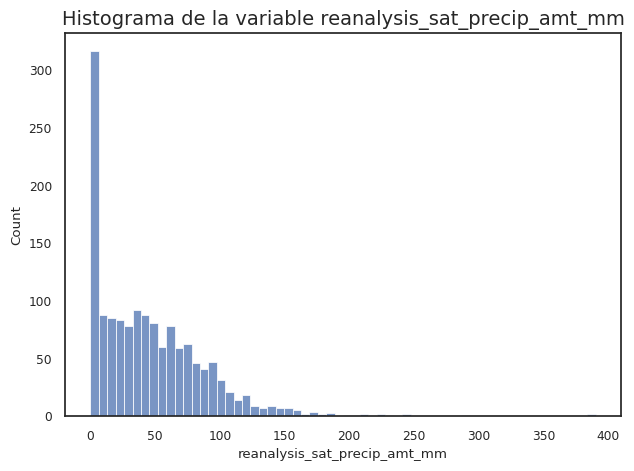

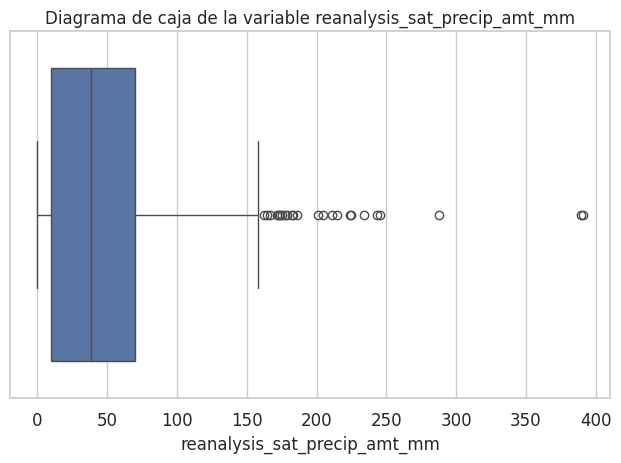

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.7440537903855184
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 6.853510301958016
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 12 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       45.747569
std        43.538117
min         0.000000
25%         9.960000
50%        38.170000
75%        70.047500
max       390.600000
Name: reanalysis_sat_precip_amt_mm, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_sat_precip_amt_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_specific_humidity_g_per_kg

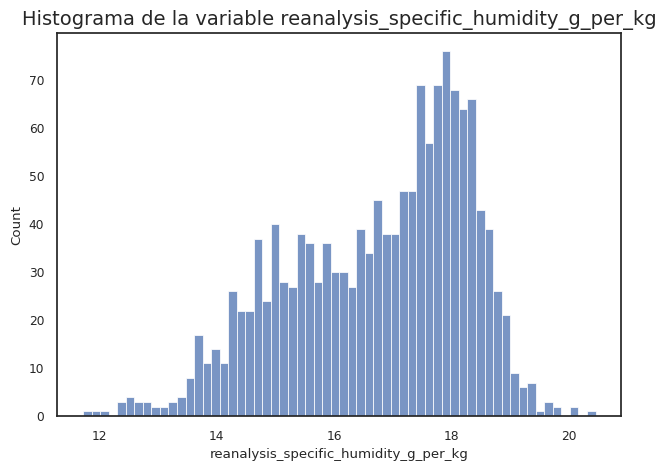

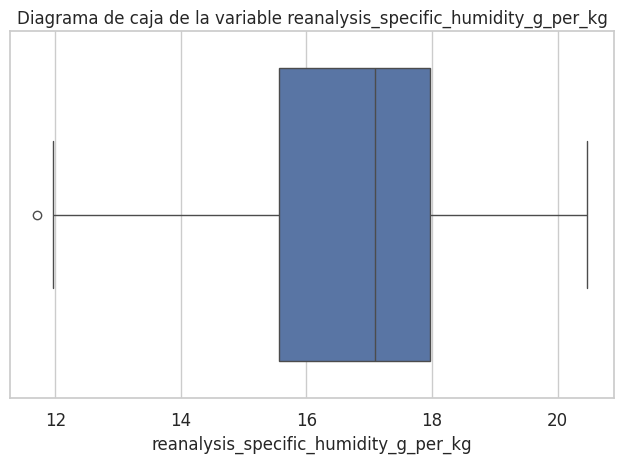

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.5410433822369157
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.4674009171630411
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       16.746348
std         1.537395
min        11.715714
25%        15.561429
50%        17.084286
75%        17.974643
max        20.461429
Name: reanalysis_specific_humidity_g_per_kg, dtype: float64


In [ ]:
outlier = outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_specific_humidity_g_per_kg')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_tdtr_k

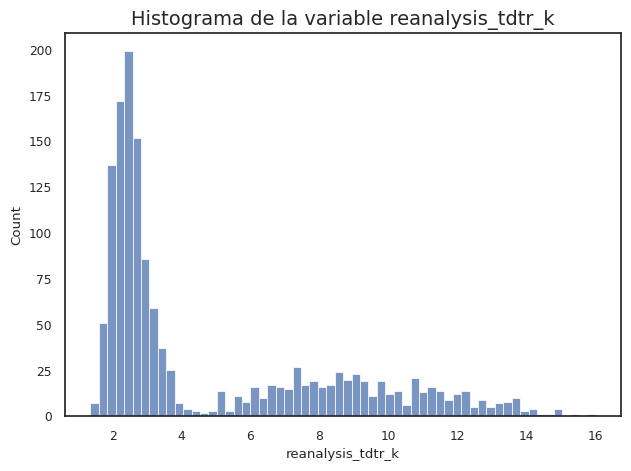

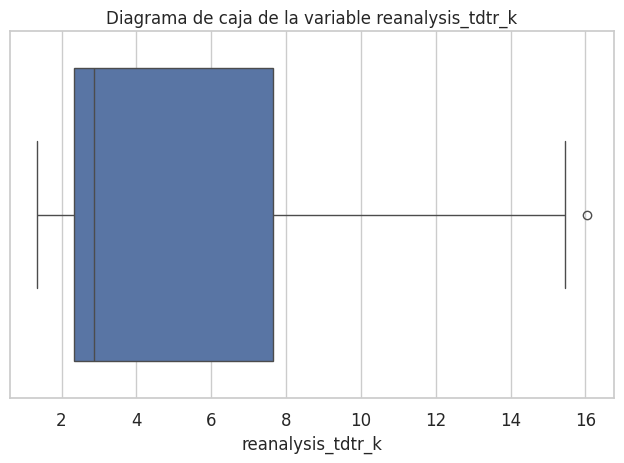

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.0673179425275816
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.20834046057873135
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        4.905783
std         3.544011
min         1.357143
25%         2.328571
50%         2.857143
75%         7.646429
max        16.028571
Name: reanalysis_tdtr_k, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_tdtr_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_avg_temp_c

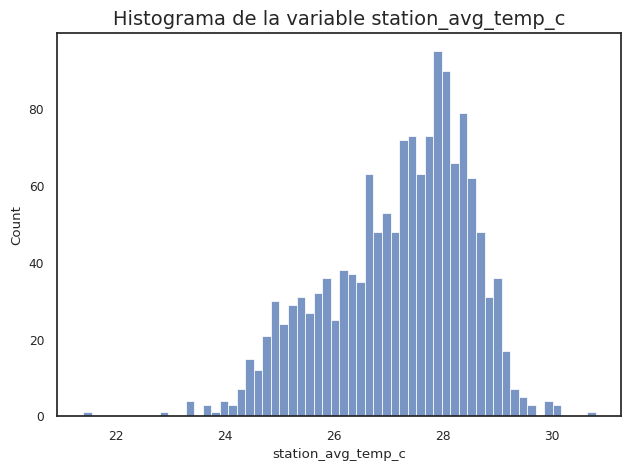

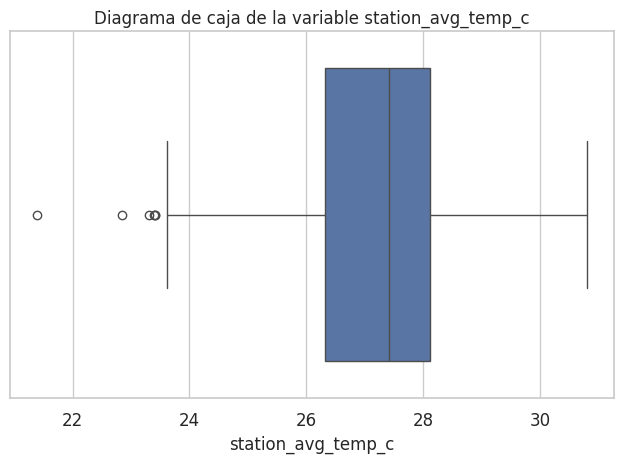

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.5689322734395355
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.1017329748009459
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       27.184150
std         1.277868
min        21.400000
25%        26.322321
50%        27.414286
75%        28.128571
max        30.800000
Name: station_avg_temp_c, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_avg_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_diur_temp_rng_c

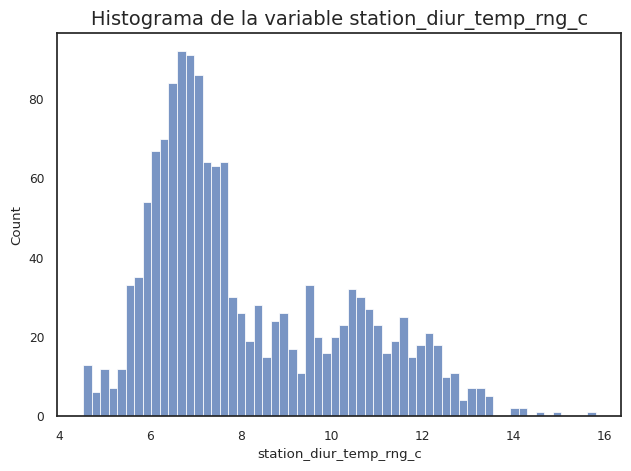

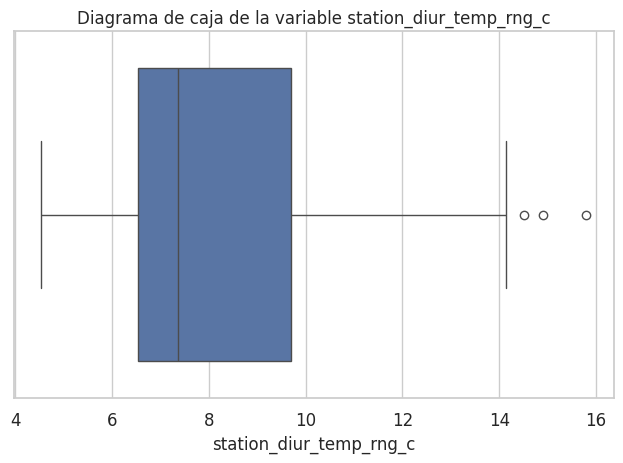

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.7880885027697254
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.3666623642390454
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        8.112995
std         2.134508
min         4.528571
25%         6.528571
50%         7.371429
75%         9.700000
max        15.800000
Name: station_diur_temp_rng_c, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_diur_temp_rng_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_max_temp_c

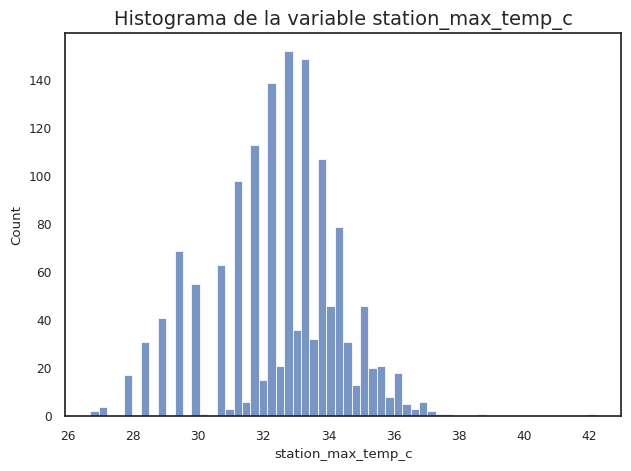

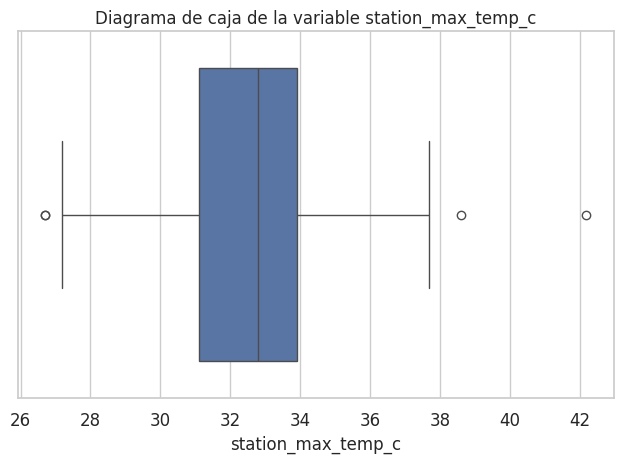

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.27106578001201165
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: 0.24126258295748348
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       32.460542
std         1.950839
min        26.700000
25%        31.100000
50%        32.800000
75%        33.900000
max        42.200000
Name: station_max_temp_c, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_max_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_min_temp_c

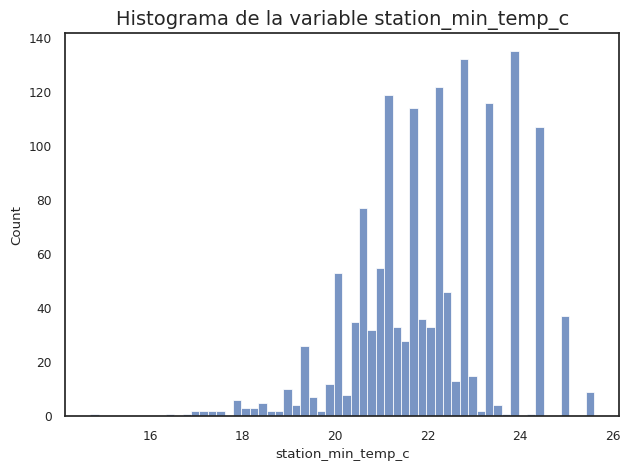

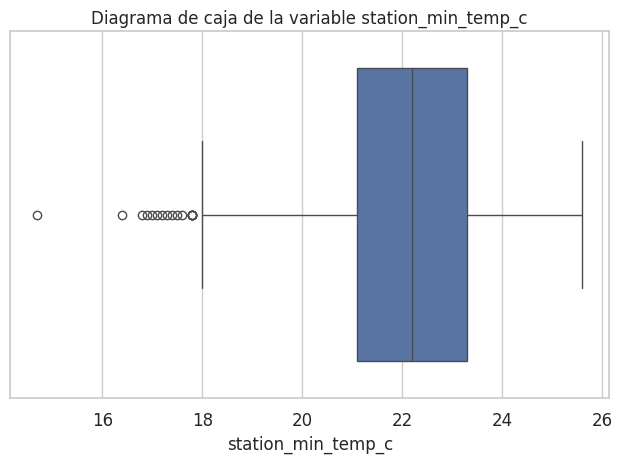

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.3043998971594126
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: 0.2412993296081538
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 2 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.099639
std         1.568100
min        14.700000
25%        21.100000
50%        22.200000
75%        23.300000
max        25.600000
Name: station_min_temp_c, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_min_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_precip_mm

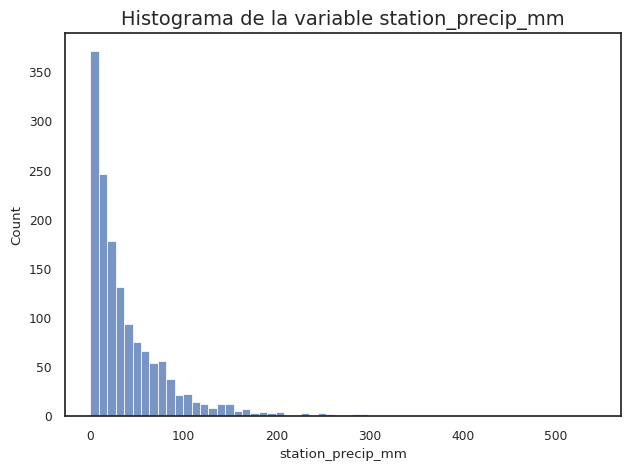

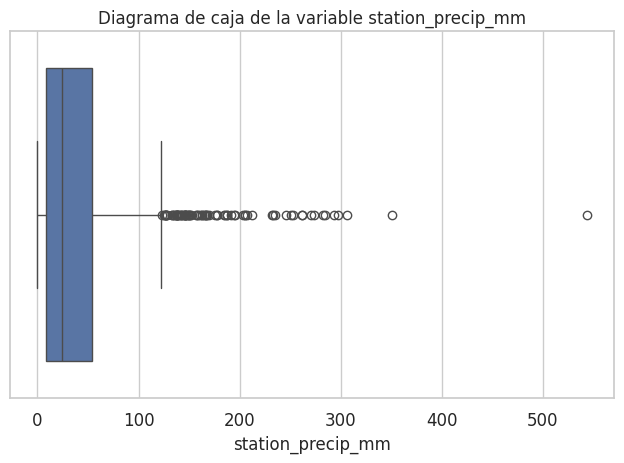

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 2.972072268158726
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría muy alta. La distribución es extremadamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 15.332530936422021
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 56 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       39.377207
std        47.305192
min         0.000000
25%         8.700000
50%        23.850000
75%        54.100000
max       543.300000
Name: station_precip_mm, dtype: float64


In [ ]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_precip_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable city

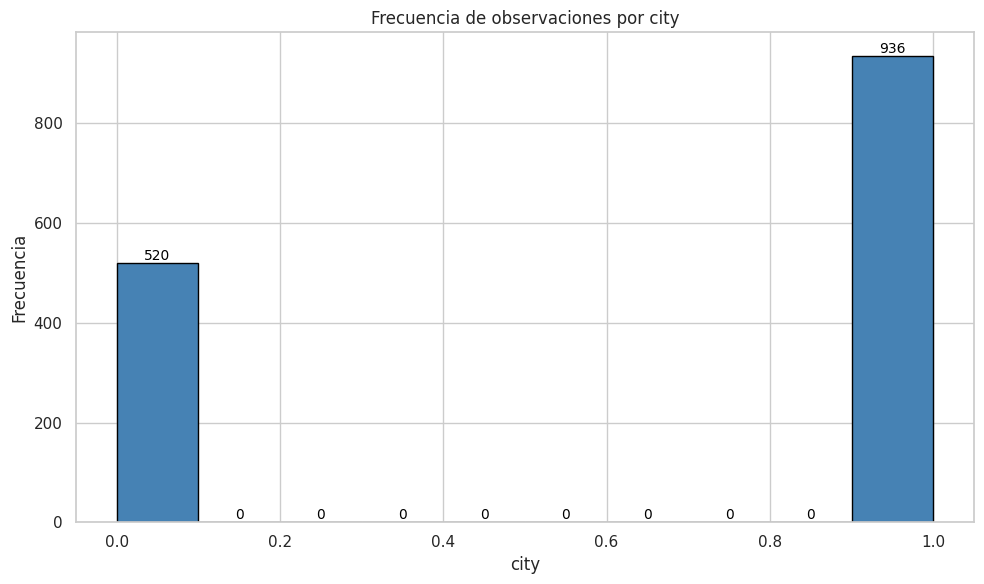

In [ ]:
make_histogram(df=df_temp_cleaned,variable='city')

#### Analizando la variable total_cases

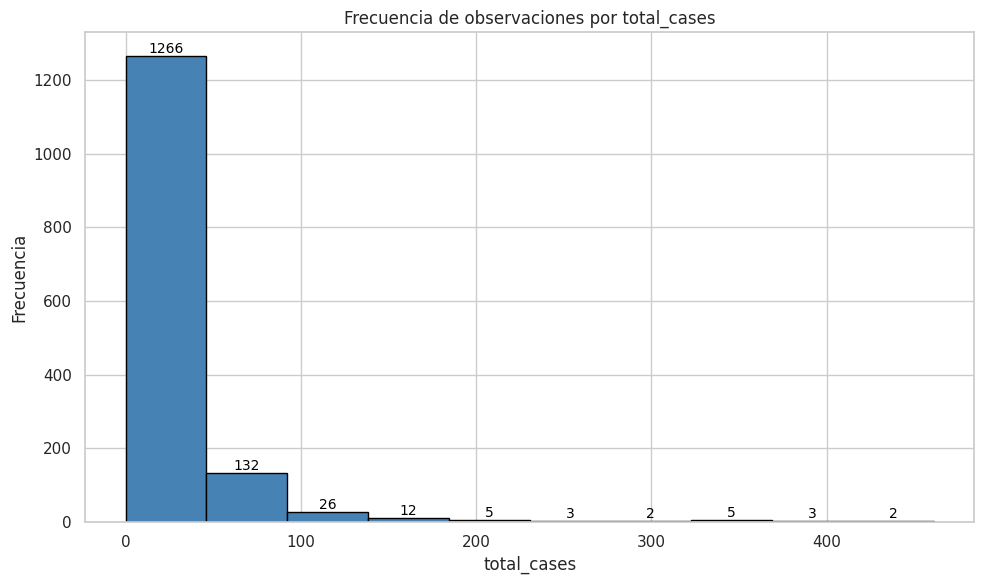

In [ ]:
make_histogram(df=df_temp_cleaned,variable='total_cases')

#### Resultados
Se observo de mejor maner la forma de cada una de la varibles de los datos y sus propiedades con el objetivo de conocer como esta la distribución de los datos, su forma y sus medidas de tendencia crentral.

### Detección de outliers en variables numericas continuas
Para realizar el analisis de los datos atipicos en las variables numericas continuas tambien se va a usar el rango intercuantilico, el cual es un método excelente para detectar valores atípicos en un conjunto de datos. \
El valor de k usado en este caso es de `k=2`, este valor es debido a que se tiene una gran cantidad de datos de diferente tipo y lo ideal es reducir la sensibilidad en este caso un 0.5, debido a que no son considerados como errores sino casos especiales de los datos.

In [ ]:
#Se imprime las variables con outliers
var_outliers = outliers[outliers['num_outliers']>0]
var_outliers

,variable,num_outliers
0,ndvi_ne,1
1,ndvi_nw,2
2,ndvi_sw,11
3,precipitation_amt_mm,12
9,reanalysis_precip_amt_kg_per_m2,62
10,reanalysis_relative_humidity_percent,1
11,reanalysis_sat_precip_amt_mm,12
14,station_avg_temp_c,1
16,station_max_temp_c,1
17,station_min_temp_c,2


Las variables ndvi_ne, ndvi_nw, ndvi_sw al corresponder a (Normalized difference vegetation index) no se los considera como outliers en nuestros datos pero el resto de variables si son analizadas como cantidatas en la eliminación de outliers.

In [ ]:
numerical_columns_outliers = ['precipitation_amt_mm', 'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k','reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2','reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                              'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 'station_precip_mm']

detectar_outliers_var(df_temp_cleaned,input_columns=numerical_columns_outliers,k=2)

<ipython-input-40-166b583c9808>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
88,1.0,1992.0,2.0,0.100833,0.073575,0.138714,0.112786,200.85,24.762857,24.971429,21.307143,27.25,22.95,18.30,81.300000,200.85,15.878571,2.300000,25.657143,7.500000,30.6,20.6,58.2,1.0,104
264,1.0,1995.0,21.0,0.032200,0.162133,0.231829,0.240271,204.62,26.304286,26.428571,22.844286,28.55,24.15,17.30,81.447143,204.62,17.412857,2.328571,27.228571,7.342857,31.7,22.2,97.5,5.0,4
332,1.0,1996.0,38.0,0.055650,0.028450,0.150429,0.107817,243.55,26.332857,26.292857,23.730000,28.15,24.45,151.70,85.690000,243.55,18.407143,1.828571,27.042857,5.828571,31.7,22.8,305.9,9.0,24
438,1.0,1998.0,40.0,-0.002200,0.038200,0.161886,0.168314,223.61,27.447143,27.607143,23.388571,29.75,25.35,124.40,78.782857,223.61,18.061429,2.800000,27.914286,6.285714,32.8,23.9,24.7,10.0,102
498,1.0,1999.0,47.0,0.000500,0.071200,0.107700,0.088740,224.90,25.582857,25.728571,23.135714,27.65,23.95,140.20,86.405714,224.90,17.870000,1.900000,26.600000,4.528571,31.7,23.3,88.9,11.0,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1314,0.0,2007.0,41.0,0.385186,0.405071,0.310629,0.438129,39.09,26.425714,28.235714,22.297143,36.45,21.65,38.28,80.450000,39.09,17.010000,11.600000,28.400000,10.600000,34.2,21.8,145.1,10.0,11
1321,0.0,2007.0,48.0,0.165640,0.179300,0.127600,0.181914,129.33,24.730000,26.178571,24.067143,32.05,21.25,65.57,96.522857,129.33,18.924286,6.942857,27.125000,8.350000,32.3,22.4,293.1,11.0,9
1324,0.0,2007.0,51.0,0.269800,0.275686,0.275514,0.236714,146.13,23.991429,25.092857,23.247143,33.45,20.15,89.72,96.074286,146.13,18.034286,5.685714,27.625000,9.000000,32.9,22.4,261.3,12.0,26
1338,0.0,2008.0,13.0,0.336600,0.304214,0.322900,0.377314,62.13,23.944286,24.842857,22.798571,30.55,19.95,53.36,94.074286,62.13,17.507143,6.557143,26.900000,8.266667,31.7,22.6,282.7,3.0,6


#### Detección de outliers por ciudad
Se realiza la detección de esta tipo para no eliminar datos que pueden ser considerados anomalos en una ciudad pero en la otra puedan ser datos normales.

##### Detección de outliers para la ciudad 0

In [ ]:
df_temp_cleaned_0=df_temp_cleaned[df_temp_cleaned["city"]==0]
detectar_outliers_var(df_temp_cleaned_0,input_columns=numerical_columns_outliers,k=2)

<ipython-input-40-166b583c9808>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
1335,0.0,2008.0,10.0,0.169743,0.138667,0.170057,0.200843,210.83,24.604286,26.185714,22.370000,34.75,20.15,39.10,88.972857,210.83,17.064286,8.957143,27.180000,8.880000,33.3,21.9,119.6,3.0,23
946,0.0,2000.0,36.0,0.295586,0.295683,0.312214,0.265929,23.12,27.652857,28.785714,17.485714,39.65,18.35,2.50,57.787143,23.12,12.652857,14.900000,28.366667,12.900000,35.8,21.7,56.9,9.0,1
987,0.0,2001.0,26.0,0.192300,0.275286,0.316457,0.325414,1.22,21.695714,22.850000,17.422857,32.95,15.25,1.82,79.322857,1.22,12.464286,12.342857,25.300119,11.126155,32.3,17.1,31.0,6.0,0
1242,0.0,2006.0,20.0,0.339286,0.348286,0.315829,0.374571,1.52,22.904286,23.764286,16.938571,32.45,14.05,0.10,72.034286,1.52,12.111429,12.371429,25.200000,11.700000,31.7,19.4,2.0,5.0,7
1040,0.0,2002.0,27.0,0.101543,0.126600,0.119357,0.076243,3.27,21.485714,21.742857,18.644286,31.95,14.25,6.20,85.565714,3.27,13.454286,8.700000,26.275000,9.500000,32.6,20.7,5.1,7.0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1285,0.0,2007.0,12.0,0.213240,0.223129,0.264371,0.221829,150.33,24.534286,25.578571,22.740000,32.25,19.45,59.20,90.858571,150.33,17.470000,8.171429,27.000000,10.650000,33.9,21.7,252.7,3.0,7
1290,0.0,2007.0,17.0,0.271371,0.183657,0.203000,0.300600,157.86,24.192857,25.128571,23.352857,31.75,19.75,62.30,95.525714,157.86,18.104286,7.300000,27.033333,7.766667,34.1,22.0,261.7,4.0,8
1321,0.0,2007.0,48.0,0.165640,0.179300,0.127600,0.181914,129.33,24.730000,26.178571,24.067143,32.05,21.25,65.57,96.522857,129.33,18.924286,6.942857,27.125000,8.350000,32.3,22.4,293.1,11.0,9
1324,0.0,2007.0,51.0,0.269800,0.275686,0.275514,0.236714,146.13,23.991429,25.092857,23.247143,33.45,20.15,89.72,96.074286,146.13,18.034286,5.685714,27.625000,9.000000,32.9,22.4,261.3,12.0,26


Se han detectado 64 filas que tienen outliers en los datos para la ciudad 0

##### Detección de outliers para la ciudad 1

In [ ]:
df_temp_cleaned_1=df_temp_cleaned[df_temp_cleaned["city"]==1]
detectar_outliers_var(df_temp_cleaned_1,input_columns=numerical_columns_outliers,k=2)

<ipython-input-40-166b583c9808>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
88,1.0,1992.0,2.0,0.100833,0.073575,0.138714,0.112786,200.85,24.762857,24.971429,21.307143,27.25,22.95,18.30,81.300000,200.85,15.878571,2.300000,25.657143,7.500000,30.6,20.6,58.2,1.0,104
108,1.0,1992.0,22.0,0.121500,0.139033,0.219157,0.213014,186.25,25.465714,25.600000,23.184286,28.25,23.85,130.30,87.301429,186.25,17.832857,2.357143,27.428571,5.957143,31.7,23.9,80.2,5.0,20
264,1.0,1995.0,21.0,0.032200,0.162133,0.231829,0.240271,204.62,26.304286,26.428571,22.844286,28.55,24.15,17.30,81.447143,204.62,17.412857,2.328571,27.228571,7.342857,31.7,22.2,97.5,5.0,4
265,1.0,1995.0,22.0,0.140597,0.241200,0.102471,0.109571,178.89,26.452857,26.457143,22.842857,28.85,24.95,20.33,80.727143,178.89,17.411429,1.957143,27.700000,7.328571,33.3,23.3,9.1,6.0,16
303,1.0,1996.0,9.0,0.076000,0.108975,0.269933,0.222771,177.58,24.448571,24.557143,20.581429,26.45,22.85,15.67,79.198571,177.58,15.128571,2.300000,25.557143,7.214286,29.4,21.1,4.6,2.0,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,1.0,2006.0,3.0,-0.194233,-0.111740,0.101514,0.101114,74.41,25.251429,25.378571,21.267143,27.75,23.55,41.50,78.720000,74.41,15.794286,2.428571,24.714286,6.357143,30.6,20.6,101.1,1.0,19
846,1.0,2006.0,31.0,-0.114500,0.099550,0.152329,0.153129,93.78,27.250000,27.321429,23.808571,29.55,25.25,72.24,81.645714,93.78,18.427143,2.800000,27.828571,6.271429,32.2,22.8,100.0,8.0,16
857,1.0,2006.0,42.0,0.123350,0.115200,0.070271,0.058429,64.15,27.605714,27.621429,23.694286,29.75,25.45,37.00,79.414286,64.15,18.394286,3.028571,28.357143,7.528571,33.3,23.9,140.8,10.0,14
883,1.0,2007.0,17.0,0.021600,0.020550,0.097443,0.064200,69.70,25.872857,26.100000,22.341429,29.65,23.75,63.10,81.112857,69.70,16.907143,3.357143,26.871429,7.428571,34.4,21.7,163.1,4.0,1


Se han detectado 88 filas que tienen outliers en los datos para la ciudad 1

##### Eliminación de los outliers por ciudad
Se decide eliminar las filas que tengan outliers por ciudad ya que no representan un margen muy amplio dentro del conjunto de datos

In [ ]:
#Eliminación de los outliers del dataframe
df_cleaned_0 = eliminar_outliers_iqr_multi(df_temp_cleaned_0,numerical_columns_outliers,2)
df_cleaned_1 = eliminar_outliers_iqr_multi(df_temp_cleaned_1,numerical_columns_outliers,2)
df_temp_cleaned = pd.concat([df_cleaned_0, df_cleaned_1], ignore_index=True, sort=False)
df_temp_cleaned.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases
0,0.0,2000.0,26.0,0.192886,0.132257,0.340886,0.247200,25.41,23.590000,25.300000,22.034286,34.15,19.95,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,7.0,0
1,0.0,2000.0,27.0,0.216833,0.276100,0.289457,0.241657,60.61,23.484286,25.278571,22.208571,33.45,17.95,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,7.0,0
2,0.0,2000.0,28.0,0.176757,0.173129,0.204114,0.128014,55.52,23.265714,24.242857,22.472857,31.35,19.45,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,7.0,0
3,0.0,2000.0,30.0,0.328643,0.322129,0.254371,0.361043,62.76,23.282857,24.485714,20.807143,33.85,18.35,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,7.0,0
4,0.0,2000.0,32.0,0.312486,0.329986,0.380586,0.387271,89.37,24.170000,25.828571,20.671429,35.65,18.95,26.68,83.275714,89.37,15.311429,11.471429,27.016667,11.650000,34.0,19.9,72.9,8.0,0


De esta manera se han eliminado los outliers de nuestro dataset tomando en cuenta los subgrupos de datos que en este caso el mas relevantes es la ciudad.

### Analisis bivariante
Se realiza el analisis bivariante para determinar si existe una asociación entre las variables y, en caso afirmativo, describir la naturaleza y el grado de esa relación.

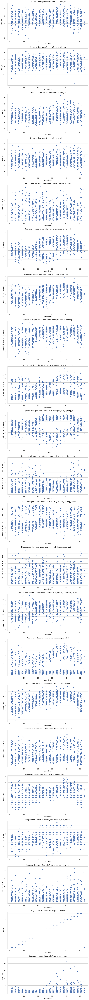

In [ ]:
columns_to_plot = df_temp_cleaned.columns[3:]
num_columns = len(columns_to_plot)
fig, axes = plt.subplots(nrows=num_columns, figsize=(10, 5 * num_columns))

# Graficar cada columna contra 'weekofyear'
for i, col in enumerate(columns_to_plot):
    sns.scatterplot(
        data=df_temp_cleaned,
        x='weekofyear',
        y=col,
        ax=axes[i]
    )
    axes[i].set_title(f'Diagrama de dispersión weekofyear vs {col}')
    axes[i].set_xlabel('weekofyear')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

In [ ]:
df_temp_cleaned.columns

Index(['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month', 'total_cases'],
      dtype='object')

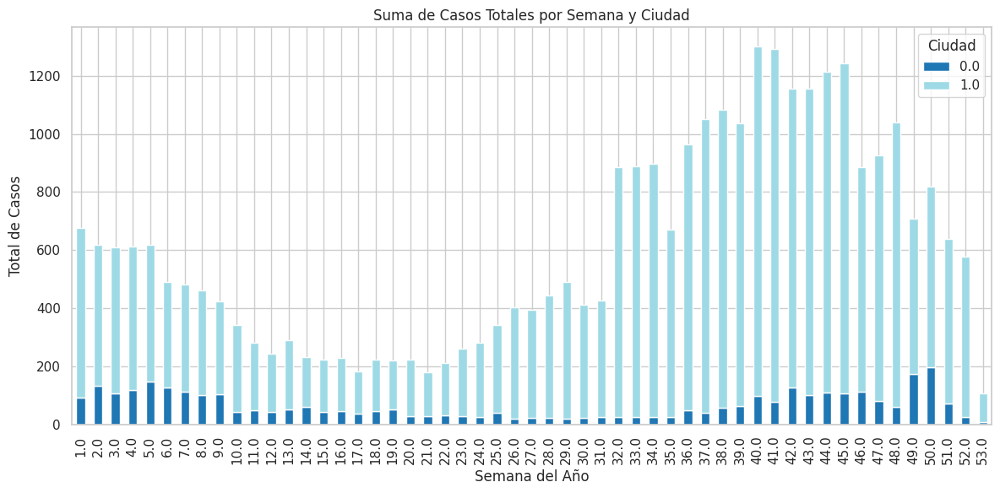

In [ ]:
df_grouped = df_temp_cleaned.groupby(['weekofyear', 'city'])['total_cases'].sum().reset_index()

# Pivotar el DataFrame para tener ciudades como columnas
df_pivot = df_grouped.pivot(index='weekofyear', columns='city', values='total_cases').fillna(0)

# Crear el gráfico de barras apiladas
df_pivot.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title('Suma de Casos Totales por Semana y Ciudad')
plt.xlabel('Semana del Año')
plt.ylabel('Total de Casos')
plt.legend(title='Ciudad')
plt.tight_layout()
plt.show()

### Analisis multivariable
Se realiza el analisis multivariable para el analisis de las relaciones que se tienen entre todas las variables numericas del dataframe

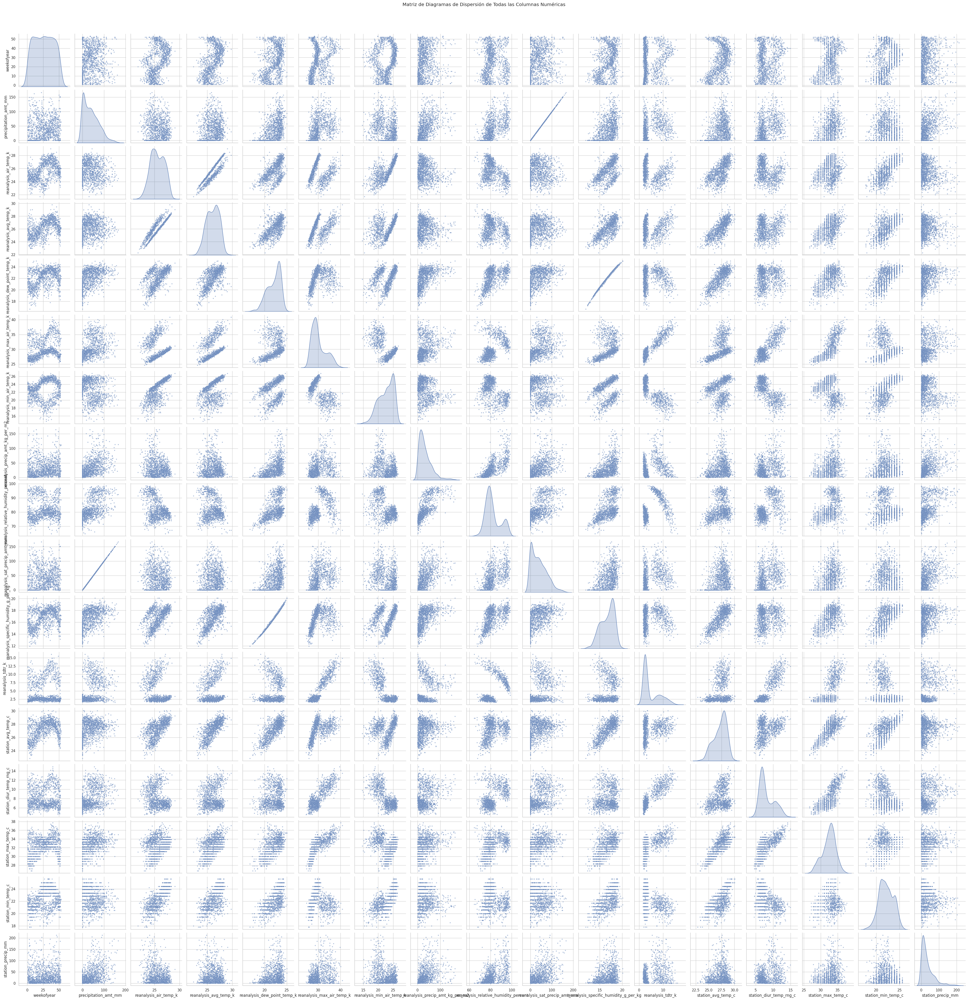

In [ ]:
numerical_columns = ['weekofyear','precipitation_amt_mm', 'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k','reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2','reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                              'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 'station_precip_mm']


# Crear la matriz de gráficos de dispersión
sns.pairplot(df_temp_cleaned[numerical_columns], diag_kind='kde', plot_kws={'alpha': 0.5, 's': 10})

# Mostrar la gráfica
plt.suptitle('Matriz de Diagramas de Dispersión de Todas las Columnas Numéricas', y=1.02)
plt.show()

#### Matriz de correlación

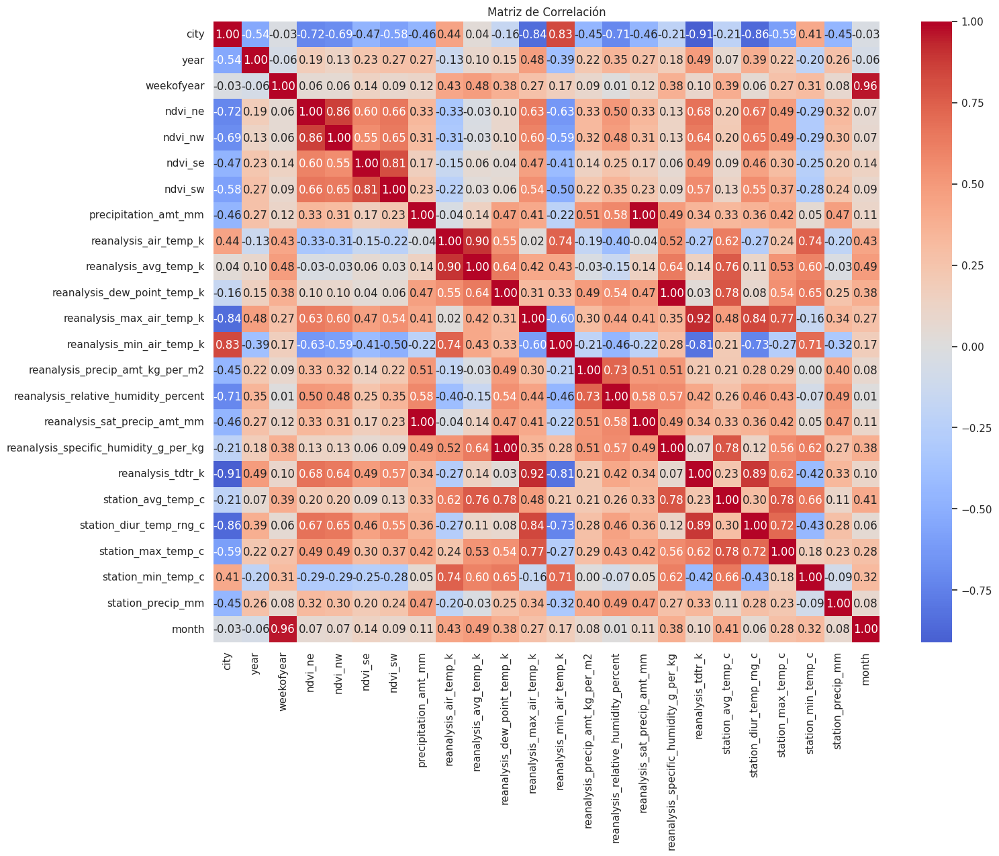

In [ ]:
column_analisys = ['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
'reanalysis_precip_amt_kg_per_m2',
'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
'station_min_temp_c', 'station_precip_mm', 'month']

matriz_correlacion = df_temp_cleaned[column_analisys].corr()

plt.figure(figsize=(16, 12))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

De esta manera se ha analizado el dataframe realizando un preprocesamiento cuando ha sido necesario para tener una mejor calidad de datos y puedan ser interpretados de mejor manera por los algoritmos de machine learning, ademas de mostrar las relaciones que guardan las variables y como estan distribuidas.

### Creación de nuevas variables
Tal como se vio en la practica 1 existen caracteristicas que son relevantes en el analisis de los datos es por ello que se va a ocupar la mismas variables creadas anteriormente para ingresarlas en nuestro analisis de los datos.

#### Crear columnas en el dataframe después del analisis
Se ha creado la columna que dada su naturaleza se considera pertienentes para enriquecer en análisis y comparar las caracteristicas que aportan mayor información.
+ NDVI promedio: calcula el promedio de los valores de NDVI (índice de vegetación) de los cuadrantes para obtener una visión general de la vegetación en toda la ciudad.

In [ ]:
# Se crea la columna NDVI promedio para los datos de entrenamiento y de prueba
df_dengue = df_temp_cleaned.copy()
df_dengue['ndvi_avg'] = df_dengue[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].mean(axis=1)
test['ndvi_avg'] = test[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].mean(axis=1)

In [ ]:
df_dengue.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,total_cases,ndvi_avg
0,0.0,2000.0,26.0,0.192886,0.132257,0.340886,0.247200,25.41,23.590000,25.300000,22.034286,34.15,19.95,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,7.0,0,0.228307
1,0.0,2000.0,27.0,0.216833,0.276100,0.289457,0.241657,60.61,23.484286,25.278571,22.208571,33.45,17.95,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,7.0,0,0.256012
2,0.0,2000.0,28.0,0.176757,0.173129,0.204114,0.128014,55.52,23.265714,24.242857,22.472857,31.35,19.45,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,7.0,0,0.170504
3,0.0,2000.0,30.0,0.328643,0.322129,0.254371,0.361043,62.76,23.282857,24.485714,20.807143,33.85,18.35,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,7.0,0,0.316546
4,0.0,2000.0,32.0,0.312486,0.329986,0.380586,0.387271,89.37,24.170000,25.828571,20.671429,35.65,18.95,26.68,83.275714,89.37,15.311429,11.471429,27.016667,11.650000,34.0,19.9,72.9,8.0,0,0.352582


#### Normalización de los datos
Se va a normalizar los datos de las variables númericas para que los algoritmos no se vean afectado por las escalas, para ello se va a usar RobustScaler que es util para manejar datos atipicos ayudando a manejar mejor los valores extremos de los datos, tomando en cuenta que algunos valores extremos que no eran incorrectos sino eran datos inusuales dentro del conjunto.

##### Datos de entrenamiento

In [ ]:
df_scaled_aux = df_dengue.drop(columns=['total_cases'], inplace=False)
scaler = RobustScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_scaled_aux), columns=df_scaled_aux.columns)
df_scaled['total_cases'] = df_dengue['total_cases'].values
df_scaled.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,ndvi_avg,total_cases
0,-1.0,-0.25,0.000000,0.420377,0.088515,1.607054,0.585776,-0.166891,-0.868762,-0.451589,-0.157631,1.065217,-0.756098,0.545565,1.482564,-0.166891,-0.149890,1.148048,-0.565344,1.092880,-0.107143,-0.681818,-0.471513,0.166667,0.641310,0
1,-1.0,-0.25,0.038462,0.545146,0.949840,1.035995,0.530970,0.464782,-0.916721,-0.462538,-0.083523,0.913043,-1.243902,0.630781,1.619360,0.464782,-0.062895,1.409152,-0.294288,1.348154,0.428571,-0.636364,0.906352,0.166667,0.859336,0
2,-1.0,-0.25,0.076923,0.336346,0.333251,0.088356,-0.592697,0.373441,-1.015878,-0.991735,0.028853,0.456522,-0.878049,1.200000,1.886060,0.373441,0.042910,0.857335,-0.348500,1.315909,0.071429,-0.681818,0.447937,0.166667,0.186418,0
3,-1.0,-0.25,0.153846,1.127680,1.225457,0.646406,1.711421,0.503365,-1.008101,-0.867647,-0.679423,1.000000,-1.146341,0.200152,0.981766,0.503365,-0.646583,1.255720,-0.456922,1.320209,0.178571,-1.409091,-0.445318,0.166667,1.335721,0
4,-1.0,-0.25,0.230769,1.043500,1.272505,2.047879,1.970761,0.980888,-0.605638,-0.181516,-0.737130,1.391304,-1.000000,0.044882,0.407025,0.980888,-0.701249,1.627187,-0.231042,1.375025,0.428571,-1.045455,1.359528,0.333333,1.619308,0


##### Datos de prueba

In [ ]:
x_test = pd.DataFrame(scaler.transform(test), columns=test.columns)
x_test.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,ndvi_avg
0,0.0,0.75,-0.307692,-0.683039,-0.816608,-1.037423,-0.956706,0.787618,-0.073558,-0.400494,-0.437054,-0.282609,0.048780,0.005155,-0.121670,0.787618,-0.451433,0.055182,-0.495644,-0.105948,0.178571,-0.227273,1.419777,-0.333333,-0.848213
1,0.0,0.75,-0.269231,-0.678350,-0.777686,-1.267115,-1.143442,-0.397488,-0.081335,-0.396844,-0.492938,-0.347826,0.121951,-0.102199,-0.186539,-0.397488,-0.503747,-0.049798,-0.743466,-0.589626,-1.000000,0.000000,0.348396,-0.166667,-0.911507
2,0.0,0.75,-0.230769,-0.592384,-0.781395,-0.500496,-0.953457,-0.557201,0.363253,0.011915,-0.104784,-0.043478,0.048780,-0.639272,-0.181833,-0.557201,-0.140485,0.300135,0.263311,0.128981,0.000000,0.272727,-0.471513,-0.166667,-0.706631
3,0.0,0.75,-0.192308,-0.646468,-0.822396,-0.797578,-0.615721,-0.622880,0.469540,0.201696,-0.489901,0.130435,0.170732,-0.697498,-0.799933,-0.622880,-0.510213,0.283984,0.333011,-0.359303,0.178571,1.000000,-0.542240,-0.166667,-0.725962
4,0.0,0.75,-0.153846,-0.288637,-0.464915,-1.486709,-1.107846,-0.609242,0.510369,0.172499,-0.338041,-0.021739,0.268293,-0.631994,-0.674229,-0.609242,-0.361499,0.133244,0.092933,-0.096735,0.178571,0.500000,1.652914,-0.166667,-0.693406


### Relación entre variables
Se realiza el analisis de la correlación entre variables tomando un umbral de correlación para definir qué tan alta debe ser la correlación para considerar variables como redundantes (0.8). Luego, elimina las variables de cada par de alta correlación, manteniendo solo una de ellas.

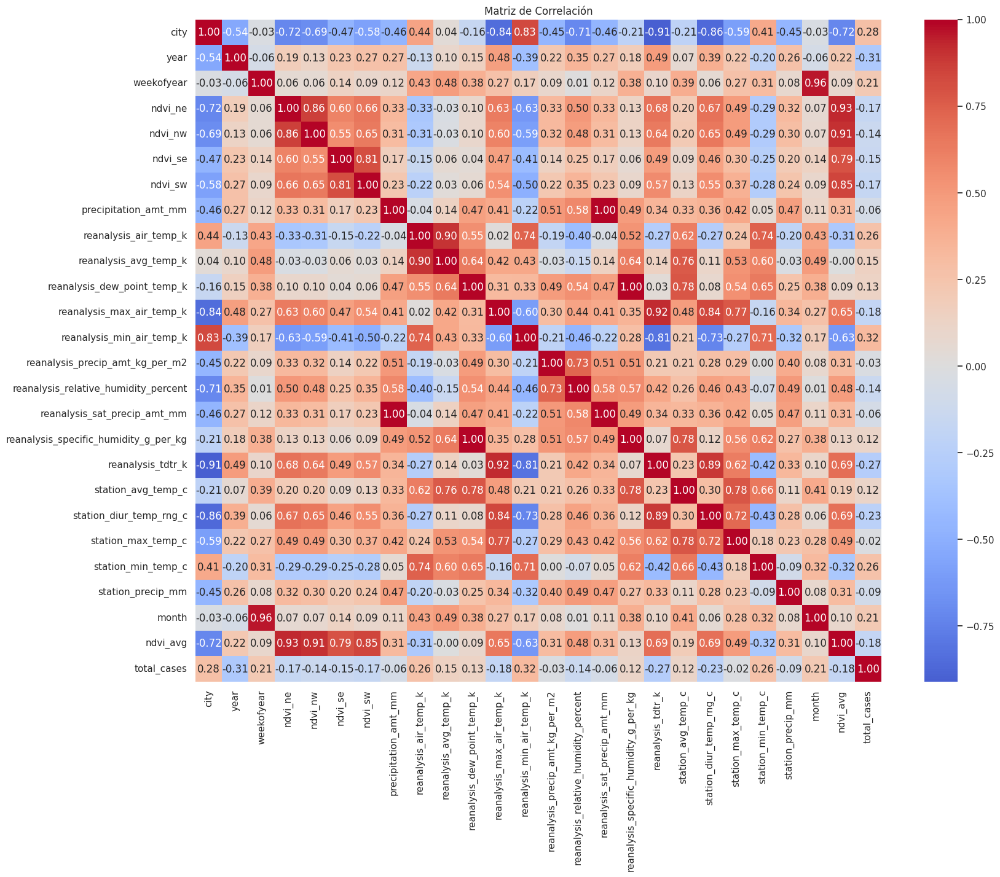

In [ ]:
matriz_correlacion = df_scaled.corr()

plt.figure(figsize=(18, 14))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

In [ ]:
# Extraer las correlaciones con la variable objetivo
correlacion_objetivo = matriz_correlacion['total_cases']

# Ordenar las correlaciones en orden descendente
correlacion_ordenada = correlacion_objetivo.sort_values(ascending=False)
correlacion_ordenada

,total_cases
total_cases,1.000000
reanalysis_min_air_temp_k,0.317278
city,0.280442
station_min_temp_c,0.260049
reanalysis_air_temp_k,0.257003
weekofyear,0.212369
month,0.211208
reanalysis_avg_temp_k,0.145992
reanalysis_dew_point_temp_k,0.130815
station_avg_temp_c,0.118442


In [ ]:
#Asignamos el umbral para seleccionar las variables que tiene mayor correlación con nuestros datos
threshold = 0.25
# Seleccionar variables con correlación significativa
selected_variables = correlacion_ordenada[abs(correlacion_ordenada) > threshold].index.tolist()
# Excluir la variable objetivo
select_variables_with_target = selected_variables.copy()
selected_variables.remove('total_cases')
#Se agrega la variable en los datos de entrenamiento debido a que es necesaria para las predicciones
selected_variables.append('weekofyear')
selected_variables

['reanalysis_min_air_temp_k',
 'city',
 'station_min_temp_c',
 'reanalysis_air_temp_k',
 'reanalysis_tdtr_k',
 'year',
 'weekofyear']

##### Conclusión
Analisando los valores obtenidos en la matriz de correlación se pude observar que la variable objetivo tienen valores pequeños por tal motivo se va a seleccionar las variables aportan información a la predicción de la variable objetivo `total_cases` son `reanalysis_min_air_temp_k`, `city`, `station_min_temp_c`,`reanalysis_air_temp_k`,`reanalysis_tdtr_k`, `year`, `weekofyear`.

---
# Predicción
---

In [ ]:
x_train = df_scaled[selected_variables]
y_train = df_scaled['total_cases']
x_test_ = x_test[selected_variables]
test_file = test[selected_variables]
if ('city' in test_file.columns):
  test_file['city'] = test_file['city'].astype(int)
  test_file['city'] = le.inverse_transform(test_file['city'])

test_file.head()

<ipython-input-79-a4c2dba1f405>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_file['city'] = test_file['city'].astype(int)
<ipython-input-79-a4c2dba1f405>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_file['city'] = le.inverse_transform(test_file['city'])


,reanalysis_min_air_temp_k,city,station_min_temp_c,reanalysis_air_temp_k,reanalysis_tdtr_k,year,weekofyear
0,23.25,sj,21.7,25.342857,3.128571,2008.0,18.0
1,23.55,sj,22.2,25.325714,2.571429,2008.0,19.0
2,23.25,sj,22.8,26.305714,4.428571,2008.0,20.0
3,23.75,sj,24.4,26.540000,4.342857,2008.0,21.0
4,24.15,sj,23.3,26.630000,3.542857,2008.0,22.0


## Algoritmos a usar para realizar las predicciones

### Random forest - A
Random Forest es un poderoso algoritmo de aprendizaje automático basado en ensambles de árboles de decisión. Es ampliamente utilizado tanto en clasificación como en regresión, especialmente cuando los datos son complejos o tienen relaciones no lineales.

In [ ]:
rf = RandomForestRegressor(random_state=seed)

# Rango de hiperparámetros para RandomizedSearchCV
param_dist = {
    'n_estimators': np.arange(50, 300, 50),
    'max_features': ['sqrt', 'log2', None],
    'max_depth': np.arange(10, 110, 20).tolist() + [None],
    'min_samples_split': np.arange(2, 10, 2),
    'min_samples_leaf': np.arange(1, 5),
    'bootstrap': [True, False]
}

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=100,
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=2,
    random_state=seed,
    n_jobs=-1
)

# Ajusta RandomizedSearchCV en el conjunto de entrenamiento
random_search.fit(x_train, y_train)

# Mejor estimador del RandomizedSearchCV
print("Mejores hiperparámetros de RandomizedSearchCV:", random_search.best_params_)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Mejores hiperparámetros de RandomizedSearchCV: {'n_estimators': 250, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': True}


In [ ]:
# Mejores parámetros encontrados con RandomizedSearchCV
best_params = random_search.best_params_

# Ajustamos el rango de valores para la búsqueda exhaustiva
param_grid = {
    'n_estimators': [
        max(best_params['n_estimators'] - 10, 10),
        best_params['n_estimators'],
        best_params['n_estimators'] + 10,
        best_params['n_estimators'] + 20,
        best_params['n_estimators'] - 20
    ],
    'max_features': [best_params['max_features']],
    'max_depth': [
        max(best_params['max_depth'] - 10, 1) if best_params['max_depth'] is not None else None,  # mínimo 1
        best_params['max_depth'],
        best_params['max_depth'] + 10 if best_params['max_depth'] is not None else None
    ],
    'min_samples_split': [
        max(best_params['min_samples_split'] - 1, 2),
        best_params['min_samples_split'],
        best_params['min_samples_split'] + 1
    ],
    'min_samples_leaf': [
        max(best_params['min_samples_leaf'] - 1, 1),
        best_params['min_samples_leaf'],
        best_params['min_samples_leaf'] + 1
    ],
    'bootstrap': [best_params['bootstrap']]
}

# GridSearchCV para una búsqueda exhaustiva
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    verbose=2,
    n_jobs=-1
)

# Ajusta GridSearchCV en el conjunto de entrenamiento
grid_search.fit(x_train, y_train)

# Mejores hiperparámetros de GridSearchCV
print("Mejores hiperparámetros de GridSearchCV:", grid_search.best_params_)

Fitting 5 folds for each of 135 candidates, totalling 675 fits
Mejores hiperparámetros de GridSearchCV: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 3, 'n_estimators': 240}


In [ ]:
best_model_grid = grid_search.best_estimator_
y_train_pred = best_model_grid.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

MAE en el conjunto de entrenamiento: 11.2348


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = best_model_grid.predict(x_test_)
download_predictions(test_file,y_predicted,'random_forest')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded random_forest.csv


### Random forest - B
Random Forest es un poderoso algoritmo de aprendizaje automático que ofrecio buenos resultado en las predicciones realizadas es por ello que se va a usar `TPOT` que utiliza algoritmos evolutivos para explorar diferentes modelos y combinaciones de hiperparámetros, con el fin de encontrar la mejor pipeline (combinación de pasos de procesamiento y modelos) para un conjunto de datos específico, con el fin de encontrar otro conjunto mejor de hiperparametros.

In [ ]:
tpot = TPOTRegressor(
    generations=7,
    population_size=20,        # Tamaño de la población
    offspring_size=10,         # Número de individuos para crear en cada generación
    mutation_rate=0.9,         # Probabilidad de mutación
    crossover_rate=0.1,        # Probabilidad de cruce
    verbosity=2,
    random_state=seed,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    config_dict={
        'sklearn.ensemble.RandomForestRegressor': {   # Configuración específica para Random Forest
            'n_estimators': [10, 50, 100, 200,250],
            'max_features': ['auto', 'sqrt', 'log2', None],
            'max_depth': [None, 10, 20, 30, 40, 50],
            'min_samples_split': [2, 4, 6, 10],
            'min_samples_leaf': [1, 2, 4, 6],
            'bootstrap': [True, False]
        }
    }
)

# Entrenar TPOT para encontrar los mejores hiperparámetros
tpot.fit(x_train, y_train)

Optimization Progress:   0%|          | 0/90 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -18.009349760143166

Generation 2 - Current best internal CV score: -18.009349760143166

Generation 3 - Current best internal CV score: -18.009349760143166

Generation 4 - Current best internal CV score: -18.009349760143166

Generation 5 - Current best internal CV score: -18.009349760143166

Generation 6 - Current best internal CV score: -18.009349760143166

Generation 7 - Current best internal CV score: -18.009349760143166

Best pipeline: RandomForestRegressor(input_matrix, bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50)


TPOTRegressor(config_dict={'sklearn.ensemble.RandomForestRegressor': {'bootstrap': [True,
                                                                                    False],
                                                                      'max_depth': [None,
                                                                                    10,
                                                                                    20,
                                                                                    30,
                                                                                    40,
                                                                                    50],
                                                                      'max_features': ['auto',
                                                                                       'sqrt',
                                                                                       'log2',
                                                                                       None],
                                                                      'min_samples_leaf': [1,
                                                                                           2,
                                                                                           4,
                                                                                           6],
                                                                      'min_samples_split': [2,
                                                                                            4,
                                                                                            6,
                                                                                            10],
                                                                      'n_estimators': [10,
                                                                                       50,
                                                                                       100,
                                                                                       200,
                                                                                       250]}},
              generations=7, n_jobs=-1, offspring_size=10, population_size=20,
              random_state=42, scoring='neg_mean_absolute_error', verbosity=2)

In [ ]:
y_train_pred_gen = tpot.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred_gen)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

MAE en el conjunto de entrenamiento: 12.0879


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = tpot.predict(x_test_)
download_predictions(test_file,y_predicted,'random_forest_gen')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded random_forest_gen.csv


### Máquinas de Soporte Vectorial para Regresión (SVR) - C
Este algoritmo es una extensión de las Máquinas de Soporte Vectorial (SVM) para problemas de regresión. En lugar de clasificar, SVR trata de encontrar una función que se ajuste a los datos dentro de un margen de error controlado, lo cual puede ser útil en tareas de predicción con variables meteorológicas si las relaciones no son completamente lineales.

In [ ]:
# Crear el modelo SVR
svr = SVR()

# Definir el espacio de búsqueda para RandomizedSearchCV
param_dist = {
    'C': uniform(loc=0.1, scale=10),  # Rango de C, penalización de margen
    'epsilon': uniform(loc=0.01, scale=0.5),  # Rango de epsilon
    'kernel': ['linear', 'poly', 'rbf'],  # Tipos de kernel
    'degree': [2, 3, 4],  # Solo relevante para el kernel polinómico
    'gamma': ['scale', 'auto']  # Parámetro gamma para el kernel 'rbf' y 'poly'
}

# Usar RandomizedSearchCV para obtener un rango de valores adecuados
random_search = RandomizedSearchCV(svr,param_distributions=param_dist,
                                   n_iter=100,
                                   cv=3,
                                   scoring='neg_mean_absolute_error',
                                   random_state=seed,
                                   n_jobs=-1)
random_search.fit(x_train, y_train)

# Mostrar los mejores parámetros encontrados con RandomizedSearchCV
print(f"Mejores parámetros encontrados por RandomizedSearchCV: {random_search.best_params_}")

Mejores parámetros encontrados por RandomizedSearchCV: {'C': 9.383185625877253, 'degree': 2, 'epsilon': 0.28638248341774497, 'gamma': 'scale', 'kernel': 'rbf'}


In [ ]:
# Obtener el modelo con los mejores parámetros de RandomizedSearchCV
best_model_random = random_search.best_estimator_

# Definir el espacio de búsqueda más refinado para GridSearchCV
param_grid = {
    'C': [random_search.best_params_['C'] - 0.5, random_search.best_params_['C'], random_search.best_params_['C'] + 0.5],
    'epsilon': [random_search.best_params_['epsilon'] - 0.05, random_search.best_params_['epsilon'], random_search.best_params_['epsilon'] + 0.05],
    'kernel': [random_search.best_params_['kernel']],
    'degree': [random_search.best_params_['degree']],
    'gamma': [random_search.best_params_['gamma']]
}

# Usar GridSearchCV para ajustar finamente los hiperparámetros
grid_search = GridSearchCV(svr,
                           param_grid,
                           scoring='neg_mean_absolute_error',
                           cv=5,
                           n_jobs=-1)
grid_search.fit(x_train, y_train)

# Mostrar los mejores parámetros encontrados por GridSearchCV
print(f"Mejores parámetros encontrados por GridSearchCV: {grid_search.best_params_}")


Mejores parámetros encontrados por GridSearchCV: {'C': 8.883185625877253, 'degree': 2, 'epsilon': 0.23638248341774498, 'gamma': 'scale', 'kernel': 'rbf'}


In [ ]:
best_model_grid = grid_search.best_estimator_
y_train_pred = best_model_grid.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

MAE en el conjunto de entrenamiento: 14.7392


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = best_model_grid.predict(x_test_)
download_predictions(test_file,y_predicted,'SVR')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded SVR.csv


### Gradient Boosting para Regresión - D
Gradient Boosting para Regresión es un algoritmo de aprendizaje automático basado en el modelo de árboles de decisión, que se utiliza para problemas de regresión, es decir, para predecir valores continuos. Es una técnica que combina varios modelos débiles para crear un modelo fuerte, donde cada árbol sucesivo intenta corregir los errores de los árboles anteriores.

In [ ]:
gb_regressor = GradientBoostingRegressor()

# Configurar el espacio de hiperparámetros para la búsqueda aleatoria
random_grid = {
    'n_estimators': np.arange(50, 300, 50),
    'max_features': ['sqrt', 'log2', None],
    'max_depth': np.arange(10, 110, 20).tolist() + [None],
    'min_samples_split': np.arange(2, 10, 2),
    'min_samples_leaf': np.arange(1, 5),
    'learning_rate': np.linspace(0.01, 0.3, 10),
    'subsample': np.linspace(0.7, 1.0, 4)
}

# Ejecutar RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=gb_regressor,
                                   param_distributions=random_grid,
                                   scoring='neg_mean_absolute_error',
                                   n_iter=50,
                                   cv=5,
                                   random_state=seed,
                                   n_jobs=-1)
random_search.fit(x_train, y_train)

# Obtener los mejores hiperparámetros de la búsqueda aleatoria
best_params_random = random_search.best_params_

print(f"Mejores parámetros encontrados por RandomizedSearchCV: {best_params_random}")

Mejores parámetros encontrados por RandomizedSearchCV: {'subsample': 1.0, 'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 90, 'learning_rate': 0.07444444444444444}


In [ ]:
param_grid = {
    'n_estimators': [best_params_random['n_estimators'] - 10,
                     best_params_random['n_estimators'],
                     best_params_random['n_estimators'] + 10],
    'max_features': [best_params_random['max_features']],
    'max_depth': [best_params_random['max_depth'] - 10,
                  best_params_random['max_depth'],
                  best_params_random['max_depth'] + 10] if best_params_random['max_depth'] is not None else [None],
    'min_samples_split': [best_params_random['min_samples_split'] + 1,
                          best_params_random['min_samples_split'],
                          best_params_random['min_samples_split'] + 2],
    'min_samples_leaf': [best_params_random['min_samples_leaf'] - 1,
                         best_params_random['min_samples_leaf'],
                         best_params_random['min_samples_leaf'] + 1],
    'learning_rate': [best_params_random['learning_rate'] * 0.08,
                      best_params_random['learning_rate'],
                      best_params_random['learning_rate'] * 1.2],
    'subsample': [max(0.7, best_params_random['subsample'] - 0.1),
                  best_params_random['subsample'],
                  min(1.0, best_params_random['subsample'] + 0.1)]
}

grid_search = GridSearchCV(estimator=gb_regressor,
                           param_grid=param_grid,
                           scoring='neg_mean_absolute_error',
                           cv=5,
                           n_jobs=-1)
grid_search.fit(x_train, y_train)

best_params_grid = grid_search.best_params_

print("Mejores hiperparámetros obtenidos de Grid Search:", best_params_grid)

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Mejores hiperparámetros obtenidos de Grid Search: {'learning_rate': 0.07444444444444444, 'max_depth': 80, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 190, 'subsample': 1.0}


In [ ]:
# Obtener el mejor modelo de GridSearchCV
best_model_grid = grid_search.best_estimator_
y_train_pred = best_model_grid.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

MAE en el conjunto de entrenamiento: 0.0006


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = best_model_grid.predict(x_test_)
download_predictions(test_file,y_predicted,'Gradient_Boosting')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded Gradient_Boosting.csv


### XGBoostRegressor - E
XGBoostRegressor es un modelo de regresión basado en el algoritmo de boosting que utiliza árboles de decisión como sus predictores básicos. XGBoost, abreviación de Extreme Gradient Boosting, es conocido por su alto rendimiento y eficiencia. Se selecciono este algoritmo ya que es una optimización de gradient boosting debido a que se noto overfitting en el algoritmo de gradient boosting.

In [ ]:
param_dist = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.3, 0.5],
    'min_child_weight': [1, 3, 5]
}

# Modelo base
xgb = XGBRegressor(objective='reg:squarederror', random_state=seed)

# RandomizedSearchCV para explorar el espacio amplio de hiperparámetros
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=50,
    scoring='neg_mean_squared_error',
    cv=5,
    verbose=1,
    random_state=seed,
    n_jobs=-1
)

# Entrenamiento de RandomizedSearchCV
random_search.fit(x_train, y_train)

# Guardamos los mejores parámetros encontrados
best_random_params = random_search.best_params_
print("Mejores hiperparámetros de RandomizedSearchCV:", best_random_params)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores hiperparámetros de RandomizedSearchCV: {'subsample': 0.6, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 1.0}


In [ ]:
param_grid = {
    'n_estimators': [best_random_params['n_estimators'] - 50,
                     best_random_params['n_estimators'],
                     best_random_params['n_estimators'] + 50],
    'max_depth': [best_random_params['max_depth'] - 1,
                  best_random_params['max_depth'],
                  best_random_params['max_depth'] + 1],
    'learning_rate': [best_random_params['learning_rate'] * 0.5,
                      best_random_params['learning_rate'],
                      best_random_params['learning_rate'] * 1.5],
    'subsample': [best_random_params['subsample'] - 0.1,
                  best_random_params['subsample'],
                  best_random_params['subsample'] - 0.2],
    'colsample_bytree': [best_random_params['colsample_bytree'] - 0.1,
                         best_random_params['colsample_bytree']],
    'gamma': [best_random_params['gamma'] - 0.05,
              best_random_params['gamma'],
              best_random_params['gamma'] + 0.05],
    'min_child_weight': [best_random_params['min_child_weight'] - 1,
                         best_random_params['min_child_weight'],
                         best_random_params['min_child_weight'] + 1]
}

grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=5,
    verbose=1,
    n_jobs=-1
)

grid_search.fit(x_train, y_train)

best_params = grid_search.best_params_
best_model_xgbost = grid_search.best_estimator_

print("Mejores hiperparámetros de GridSearchCV:", best_params)

Fitting 5 folds for each of 1458 candidates, totalling 7290 fits
Mejores hiperparámetros de GridSearchCV: {'colsample_bytree': 1.0, 'gamma': 0.1, 'learning_rate': 0.015, 'max_depth': 6, 'min_child_weight': 0, 'n_estimators': 300, 'subsample': 0.6}


In [ ]:
y_train_pred_xbost = best_model_xgbost.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred_xbost)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

MAE en el conjunto de entrenamiento: 5.2062


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = best_model_xgbost.predict(x_test_)
download_predictions(test_file,y_predicted,'XGBRegressor')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded XGBRegressor.csv


### Deep Neural Network (DNN) - F
Este algoritmo es un tipo de red neuronal artificial con múltiples capas entre la entrada y la salida. A diferencia de las redes neuronales tradicionales, que generalmente tienen una o dos capas ocultas, las redes neuronales profundas contienen varias capas ocultas, lo que les permite aprender representaciones más complejas y abstractas de los datos para probar con algoritmos de redes neuronales.

In [ ]:
class KerasRegressorCustom(BaseEstimator, RegressorMixin):
    def __init__(self, optimizer='adam', neurons=64, activation='relu', input_dim=1, epochs=50, batch_size=32):
        self.optimizer = optimizer
        self.neurons = neurons
        self.activation = activation
        self.input_dim = input_dim
        self.epochs = epochs
        self.batch_size = batch_size

    def fit(self, X, y):
        self.model = Sequential()
        self.model.add(Dense(self.neurons, input_dim=self.input_dim, activation=self.activation))
        self.model.add(Dense(self.neurons, activation=self.activation))
        self.model.add(Dense(1))
        self.model.compile(optimizer=self.optimizer, loss='mean_squared_error')
        self.model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=0)
        return self

    def predict(self, X):
        return self.model.predict(X, batch_size=self.batch_size)

model_custom = KerasRegressorCustom(input_dim=x_train.shape[1])

In [ ]:
param_dist = {
    'neurons': [8,16,32],
    'activation': ['relu', 'tanh', 'sigmoid'],
    'optimizer': ['adam', 'rmsprop'],
    'epochs': [50, 75,100],
    'batch_size': [16, 32, 64]
}

# Configuración de RandomizedSearchCV
random_search_neuronal = RandomizedSearchCV(estimator=model_custom,
                                   param_distributions=param_dist,
                                   n_iter=50, cv=5,
                                   verbose=2,
                                   n_jobs=-1,
                                   scoring='neg_mean_absolute_error',
                                   random_state=seed)

# Ajustar el modelo con RandomizedSearchCV
random_search_neuronal.fit(x_train, y_train)
best_params_random_reuronal=random_search_neuronal.best_params_

# Mejor configuración de parámetros
print("Best parameters found with RandomizedSearchCV: ", random_search_neuronal.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best parameters found with RandomizedSearchCV:  {'optimizer': 'adam', 'neurons': 8, 'epochs': 75, 'batch_size': 16, 'activation': 'tanh'}


In [ ]:
param_grid = {
    'neurons': [best_params_random_reuronal['neurons'], best_params_random_reuronal['neurons'] * 2],
    'activation': [best_params_random_reuronal['activation'], 'relu'],
    'optimizer': [best_params_random_reuronal['optimizer'], 'nadam'],
    'epochs': [best_params_random_reuronal['epochs'], best_params_random_reuronal['epochs'] + 50],
    'batch_size': [best_params_random_reuronal['batch_size'], best_params_random_reuronal['batch_size'] * 2]
}

# Configuración de GridSearchCV
grid_search_neuronal = GridSearchCV(estimator=model_custom,
                           param_grid=param_grid,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_absolute_error',
                           n_jobs=-1)

# Ajustar el modelo con GridSearchCV
grid_search_neuronal.fit(x_train, y_train)

# Mejor configuración de parámetros
print("Best parameters found with GridSearchCV: ", grid_search_neuronal.best_params_)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best parameters found with GridSearchCV:  {'activation': 'tanh', 'batch_size': 32, 'epochs': 125, 'neurons': 8, 'optimizer': 'adam'}


In [ ]:
# Obtener el mejor modelo de GridSearchCV
best_model_grid_n = grid_search_neuronal.best_estimator_
y_train_pred = best_model_grid_n.predict(x_train)
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"MAE en el conjunto de entrenamiento: {mae_train:.4f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
MAE en el conjunto de entrenamiento: 16.8758


In [ ]:
#Predicciones del modelo con los datos de prueba
y_predicted = best_model_grid_n.predict(x_test_)
download_predictions(test_file,y_predicted.flatten(),'Deep_Neural_Network')


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded Deep_Neural_Network.csv


---
# Conclusiones
---

En la realización de la predicción se probaron varios modelos de machine learning encontrandos los mejores hiperparametros en cada uno de ellos para ser evaluados usando la metrica MAE (Mean Absolute Error) para medir el rendimiento de los modelos de regresión analizados, dando los siguientes resultados

| Modelo | MAE test (DrivenData) | MAE validación | Algoritmo | Hiperparámetros | Descripción
| --- | --- | --- | --- | --- | --- |
| Modelo Final | 26,3077 | 11,2348 | Random forest - A | 'bootstrap'= True; 'max_depth'= None; 'max_features'= 'sqrt'; 'min_samples_leaf'= 5; 'min_samples_split'= 3; 'n_estimators'= 240 | Random Forest es un algoritmo de aprendizaje automático basado en árboles de decisión, este tipo de algoritmos fueron los que mejor presentaron resultados en la predicción tanto en el entrenamiento como en la competición.
| A | 26,3077 | 11,2348 | Random forest | 'bootstrap'= True; 'max_depth'= None; 'max_features'= 'sqrt'; 'min_samples_leaf'= 5; 'min_samples_split'= 3; 'n_estimators'= 240   | Random Forest es un algoritmo de aprendizaje automático basado en árboles de decisión, ideal para modelos de predicción en clasificación o regresión, especialmente con datos complejos como los de nuestro analisis. Para buscar los mejores hiperparametros se uso RandomizedSearchCV y GridSearchCV para encontrar la mejor combinación.
| B | 26,4519 | 12,0879 | Random forest | 'bootstrap'= True; 'max_depth'= 10; 'max_features'= 'sqrt'; 'min_samples_leaf'= 6; 'min_samples_split'= 4; 'n_estimators'= 50  | Random Forest es un algoritmo de aprendizaje automático basado en árboles de decisión, ideal para modelos de predicción en clasificación o regresión, especialmente con datos complejos como los de nuestro analisis. Para buscar los mejores hiperparametros se uso TPOT que utiliza algoritmos evolutivos para explorar diferentes modelos y combinaciones de hiperparámetros.
| C | 28,0481 | 14,7392 | Máquinas de Soporte Vectorial para Regresión | 'C'= 8.883185625877253; 'degree'= 2; 'epsilon'= 0.23638248341774498; 'gamma'= 'scale'; 'kernel'= 'rbf'  | Este algoritmo es una extensión de las Máquinas de Soporte Vectorial (SVM) para problemas de regresión. Para buscar los mejores hiperparametros se uso RandomizedSearchCV y GridSearchCV para encontrar la mejor combinación que den una mejor optimización al modelo.
| D | 27,2812 | 0,0006 | Gradient Boosting para Regresión | 'learning_rate'= 0.07444444444444444; 'max_depth'= 80; 'max_features'= 'log2'; 'min_samples_leaf'= 1; 'min_samples_split'= 5; 'n_estimators'= 190; 'subsample'= 1.0 | Gradient Boosting para Regresión es un algoritmo de aprendizaje automático basado en el modelo de árboles de decisión, que se utiliza para problemas de regresión. Para buscar los mejores hiperparametros se uso RandomizedSearchCV y GridSearchCV para encontrar la mejor combinación que den una mejor optimización al modelo.
| E | 28,1234 | 5,2062 | XGBoostRegressor | 'colsample_bytree'= 1.0; 'gamma'= 0.1; 'learning_rate'= 0.015; 'max_depth'= 6; 'min_child_weight'= 0; 'n_estimators'= 300; 'subsample'= 0.6  | XGBoostRegressor es un modelo de regresión basado en el algoritmo de boosting que utiliza árboles de decisión como sus predictores básicos. Se selecciono este algoritmo ya que es una optimización de gradient boosting debido a que se noto overfitting en el algoritmo de gradient boosting.
| F | 31,3966 | 16,8758 | Deep Neural Network (DNN) | 'activation'= 'tanh'; 'batch_size'= 32; 'epochs'= 125; 'neurons'= 8; 'optimizer'= 'adam' | Este algoritmo es un tipo de red neuronal artificial con múltiples capas entre la entrada y la salida. A diferencia de las redes neuronales tradicionales, que generalmente tienen una o dos capas ocultas, las redes neuronales profundas contienen varias capas ocultas, lo que les permite aprender representaciones más complejas y abstractas de los datos para probar con algoritmos de redes neuronales.


De la anterios lista de modelos seleccionados se muestra el modelo final elegido para la competición de driven data, este modelo fue seleccionado porque no presenta caracteristicas propias de los modelos con overfitting ni underfitting y esto se pudo ver reflejado con el mejor valor del score en la competición.

**Modelo final elegido**
* Nombre/Identificador: Random Forest/A
* MAE test (DrivenData): 26,3077
* MAE validación: 11,2348
* Algoritmo ML: Random Forest
* Hiperparámetros:'bootstrap'= True; 'max_depth'= None; 'max_features'= 'sqrt'; 'min_samples_leaf'= 5; 'min_samples_split'= 3; 'n_estimators'= 240
* Lista de características: 'reanalysis_min_air_temp_k','city','station_min_temp_c','reanalysis_air_temp_k','reanalysis_tdtr_k','year','weekofyear'
* Resumen del dataset (transformaciones aplicadas, etc.): El análisis del dataset incluyó preprocesamiento para eliminar duplicados, imputar valores faltantes, y convertir temperaturas de Kelvin a Celsius, facilitando la interpretación. Se eliminaron outliers para evitar sobreajustes, dado su bajo impacto en el dataset. Posteriormente, se realizó un análisis univariante, bivariante y multivariante para comprender los datos. En la selección de características relevantes para predecir total_cases, se consideraron los resultados previos y la matriz de correlación para identificar las variables más informativas.

Las consideraciones para trabajos futuros a realizarse para estea competición es tener conocimientos de expertos climatologicos para realizar una mejor selección de algoritmos que puedan ayudar a completar los datos faltantes e incluso ayudar a crear nuevos datos sintenticos con el objetivo de que los algoritmos puedan aprender a predecir de mejor manera e inclusive estos datos pueden ser usados para las redes neuronales de tipo LSTM.

---
# Competición
---

 Se adjunta la captura de los resultados de la competición obtenida al subir los modelos, el resultado que se muestra en color rojo es el resultado obtenido con el modelo final elegido y como resultado de esta practica.


 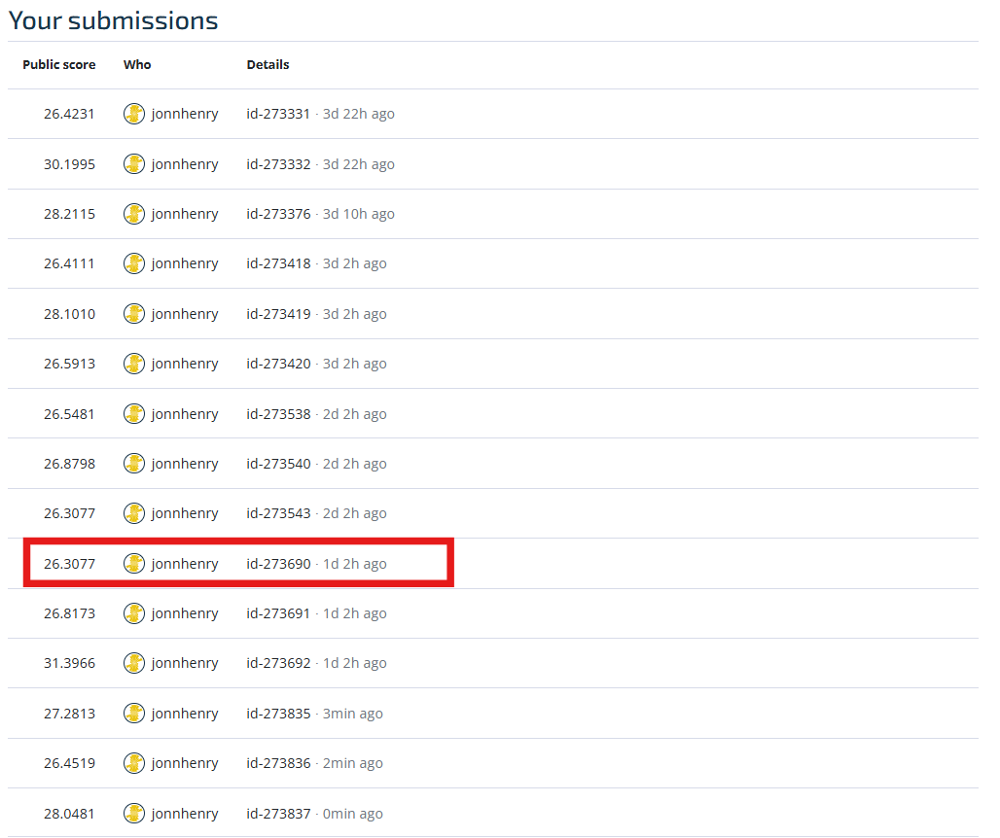

# Referencias
El código ha sido elaborado de parte propia con la ayuda de inteligencias artificiales generativas